# Documentation

### Code Details

Author            : Sagar Ladhwani (LinkedIn: https://www.linkedin.com/in/sagar-ladhwani-713b96112/) <br>
Created On        : 31st May 2021 <br>
Last Modifiied On : 22nd June 2021 <br>
Code Descr        : A detailed tracker of India's Covid-19 Pandemic & Vaccination Drive

### Importing Required Libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
import os
import datetime as dt
from datetime import datetime 
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go
from matplotlib.dates import DateFormatter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)

In [2]:
## Ignoring Warnings
warnings.filterwarnings('ignore')

In [3]:
## Getting terminal width for better printing later on
width = os.get_terminal_size().columns

# 1. Covid Cases Data

## Data Exploration

In [4]:
## Read the cases data from Covid API
cases = pd.read_csv("https://api.covid19india.org/csv/latest/states.csv")
print(cases.shape)
cases.head()

(16791, 7)


,Date,State,Confirmed,Recovered,Deceased,Other,Tested
0,2020-01-30,Kerala,1,0,0,0,NaN
1,2020-01-30,India,1,0,0,0,NaN
2,2020-02-02,Kerala,2,0,0,0,NaN
3,2020-02-02,India,2,0,0,0,NaN
4,2020-02-03,Kerala,3,0,0,0,NaN


In [5]:
## Drop unnecessary columns and Unassigned Cases
cases.drop(['Other','Tested'],axis=1,inplace=True)
cases = cases[cases['State']!='State Unassigned']
cases.shape

(16730, 5)

In [6]:
## Create required columns
cases['Active'] = cases.Confirmed - cases.Recovered - cases.Deceased
cases['Recovered/Deceased'] = cases.Recovered + cases.Deceased
cases.head()

,Date,State,Confirmed,Recovered,Deceased,Active,Recovered/Deceased
0,2020-01-30,Kerala,1,0,0,1,0
1,2020-01-30,India,1,0,0,1,0
2,2020-02-02,Kerala,2,0,0,2,0
3,2020-02-02,India,2,0,0,2,0
4,2020-02-03,Kerala,3,0,0,3,0


In [7]:
## Change type of Date column
cases['Date'] = pd.to_datetime(cases['Date'])
cases.dtypes

Date                  datetime64[ns]
State                         object
Confirmed                      int64
Recovered                      int64
Deceased                       int64
Active                         int64
Recovered/Deceased             int64
dtype: object

In [8]:
## Check for null values (if any)
cases.isna().sum()

Date                  0
State                 0
Confirmed             0
Recovered             0
Deceased              0
Active                0
Recovered/Deceased    0
dtype: int64

In [9]:
## Create a list of all states removing India from the list
states = list(np.sort(cases['State'].unique()))
states.remove('India')
print(states)

['Andaman and Nicobar Islands', 'Andhra Pradesh', 'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh', 'Chhattisgarh', 'Dadra and Nagar Haveli and Daman and Diu', 'Delhi', 'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh', 'Jammu and Kashmir', 'Jharkhand', 'Karnataka', 'Kerala', 'Ladakh', 'Lakshadweep', 'Madhya Pradesh', 'Maharashtra', 'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry', 'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Telangana', 'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal']


## a. Trend of Confirmed, Recovered/Deceased and Active Cases over time

In [10]:
## Defining starting and end points for analysis
start_date = datetime(2021, 1, 1)
end_date = datetime.today() + dt.timedelta(days=1)

In [11]:
## Define a function to plot time-series cases trend
def plot_conf_rec_act(state_name):
    
    ## Filter for State and Analysis Time Period
    state_df = cases[cases['State']==state_name]
    state_df = state_df[(state_df['Date']>=start_date) & (state_df['Date']<=end_date)]
    state_df['Mon-Year'] = state_df.Date.dt.strftime("%b-%Y")
    state_df.reset_index(drop=True,inplace=True)
    
    ## Creating a separate Dataframe for plotting text at monthly interval and last data point
    first_dates_df = state_df.loc[state_df.groupby(['Mon-Year'])['Date'].idxmin()]
    first_dates_df = first_dates_df.append(state_df.loc[state_df.index[-1]])
    
    ## Creating plots
    fig, ax = plt.subplots(figsize=(15,6))

    ## Plots for Confirmed, Recovered/Deceased and Active cases with markers at monthly interval and last data point
    markers_on = list(first_dates_df.index) + [state_df.index[-1]]
    ax.plot(state_df.Date,state_df.Confirmed,marker='o',markevery=markers_on,label='Confirmed')
    ax.plot(state_df.Date,state_df['Recovered/Deceased'],marker='^',markevery=markers_on,label='Recovered/Deceased')
    ax.plot(state_df.Date,state_df.Active,marker='D',markevery=markers_on,label='Active')
    ax.legend(loc='upper right',bbox_to_anchor=(1.225, 1.005))

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=start_date.weekday()))
    ax.set_xlim([start_date - dt.timedelta(5), end_date])
    ax.set_ylim(top=state_df.Confirmed.max()*1.2)

    ## Using a loop to plot text for all the points of each of the 3 trend lines
    for i in range(len(first_dates_df)):
        ax.text(mdates.date2num(first_dates_df.Date.iloc[i])-2,1.1*first_dates_df.Confirmed.iloc[i],'{:,}'.format(first_dates_df.Confirmed.iloc[i]))
        ax.text(mdates.date2num(first_dates_df.Date.iloc[i])-2,0.8*first_dates_df['Recovered/Deceased'].iloc[i],'{:,}'.format(first_dates_df['Recovered/Deceased'].iloc[i]))
        ax.text(mdates.date2num(first_dates_df.Date.iloc[i])-2,first_dates_df.Active.iloc[i] + 0.05*first_dates_df.Confirmed.iloc[i],'{:,}'.format(first_dates_df.Active.iloc[i]))
    
    ## Adding labels
    plt.xlabel('Month-Year')
    plt.ylabel('Count')
    plt.title('Total Covid-19 Cases in '+state_name)
    plt.legend(facecolor='White')
    plt.show()

In [12]:
## Setting Style and Context for Seaborn plots along with colors to be used
sns.set_style('darkgrid')
sns.set_context('notebook',font_scale=1.2)
colors = sns.color_palette('muted')

### Visualizations

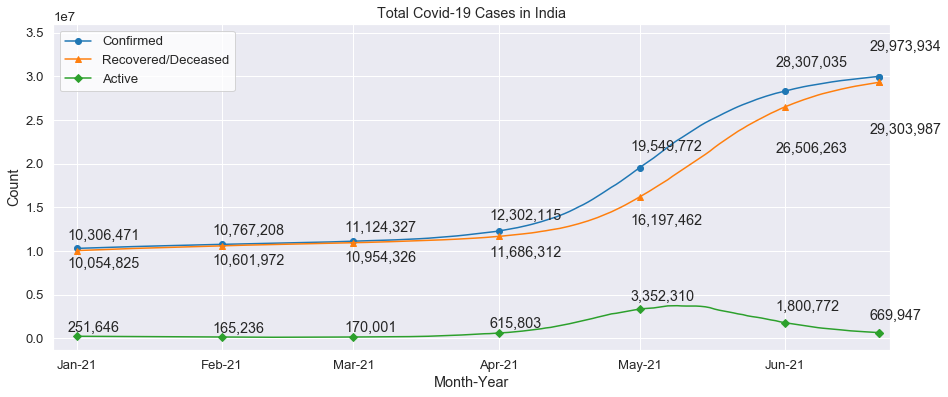

In [13]:
## Plotting time-series of Confirmed, Recovered/Deceased and Active cases for India as a whole
plot_conf_rec_act('India')

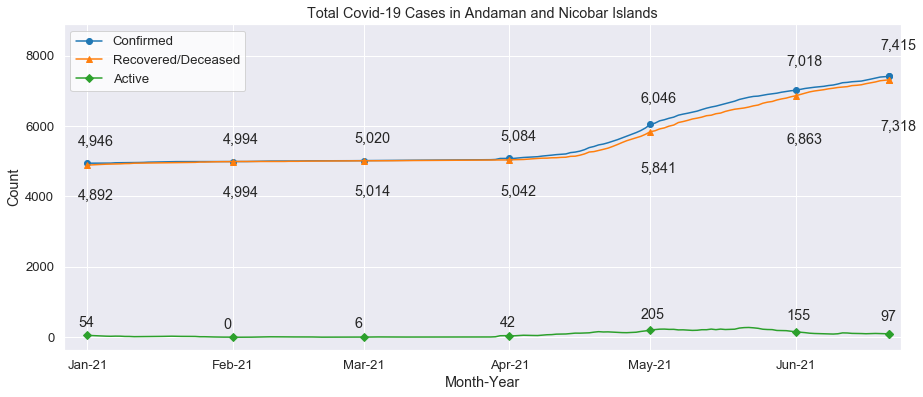

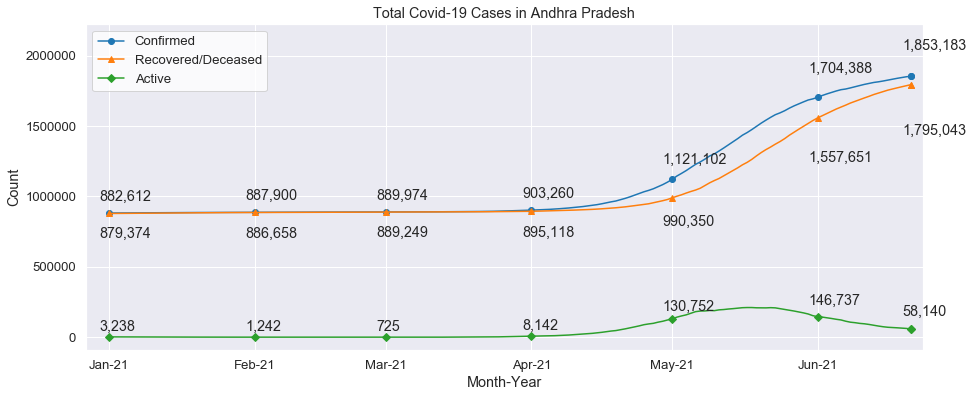

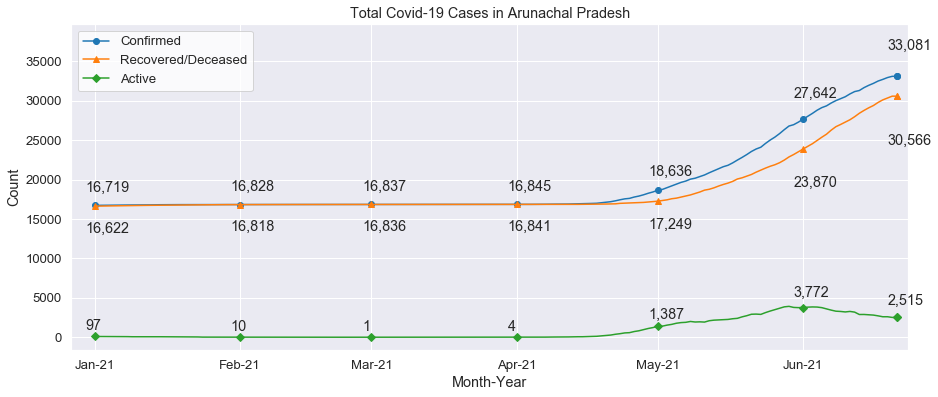

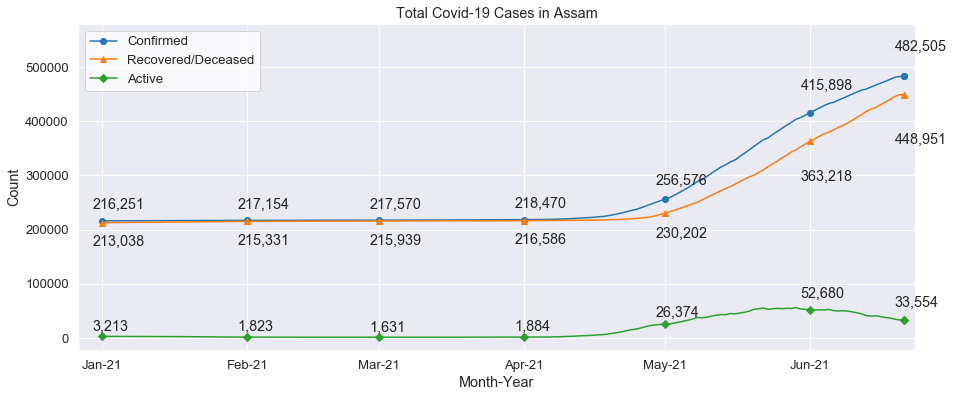

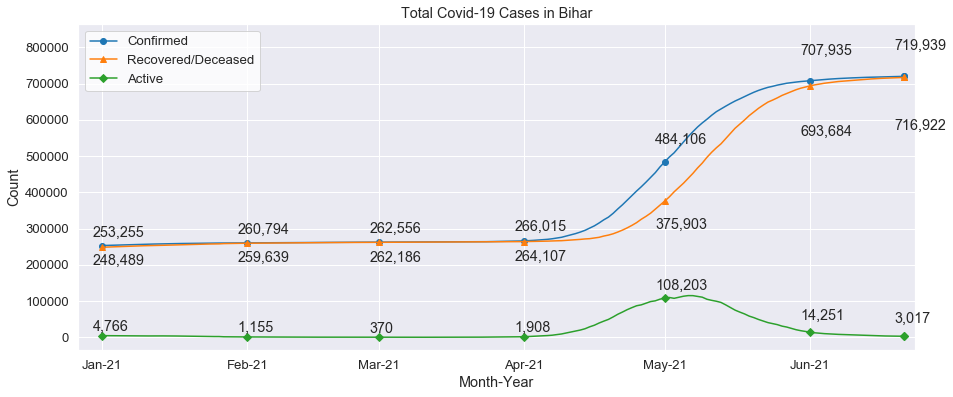

...

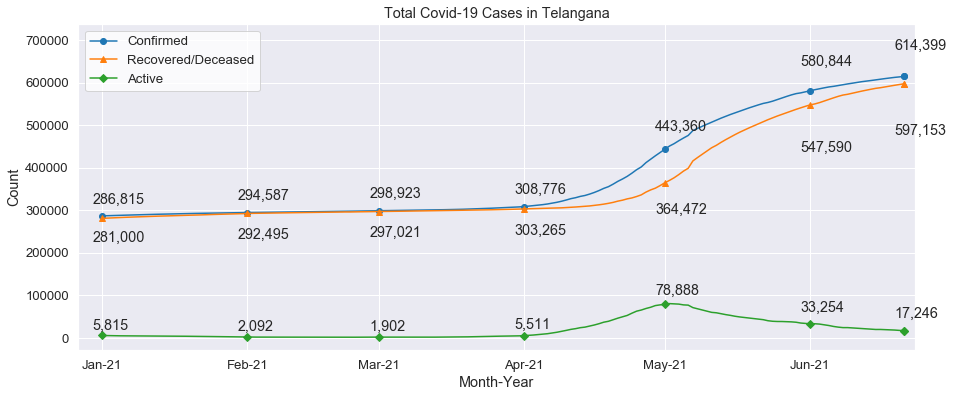

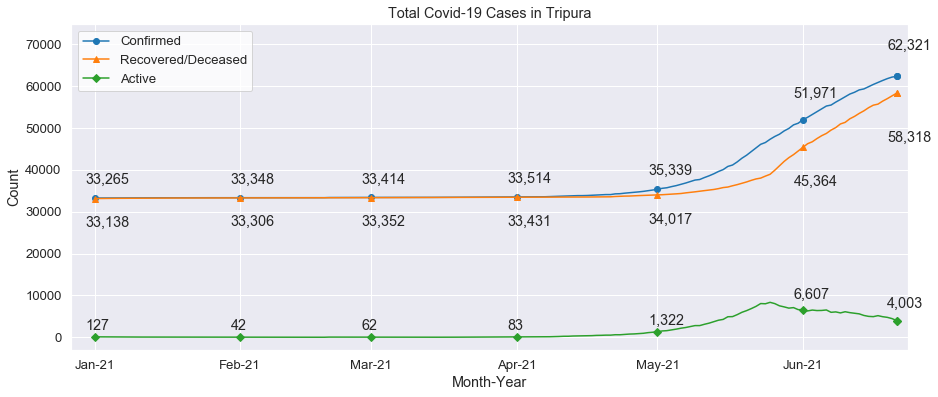

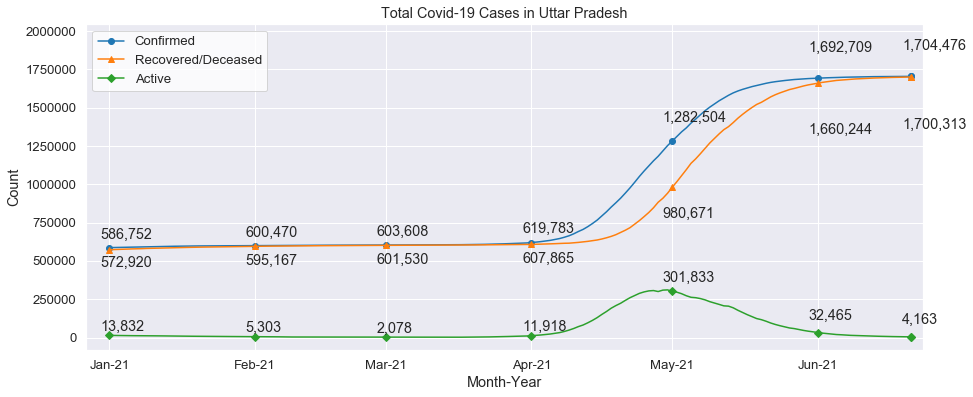

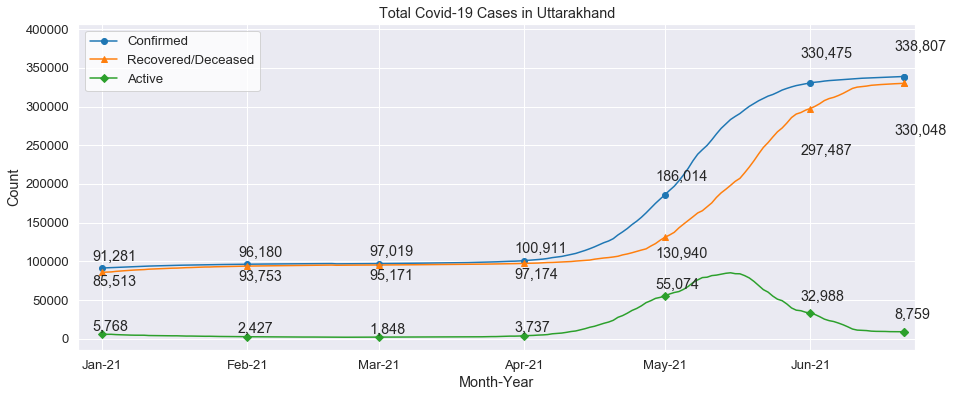

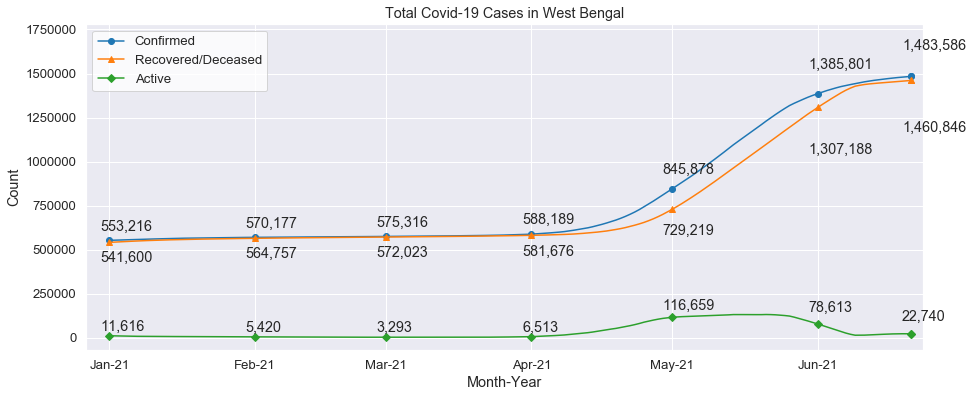

In [14]:
## Plotting time-series of Confirmed, Recovered/Deceased and Active cases for every State and UT
for state_name in states:
    plot_conf_rec_act(state_name)

## b. Top 3 states with the highest number of Active cases at any point of time

In [15]:
## Loading a copy of original data and subsetting data for choosen time period
state_df = cases.copy()
#state_df = state_df[(state_df['Date']>=start_date) & (state_df['Date']<=end_date)]
state_df['Year-Mon'] = state_df.Date.dt.strftime("%Y-%m")
state_df.head()

,Date,State,Confirmed,Recovered,Deceased,Active,Recovered/Deceased,Year-Mon
0,2020-01-30,Kerala,1,0,0,1,0,2020-01
1,2020-01-30,India,1,0,0,1,0,2020-01
2,2020-02-02,Kerala,2,0,0,2,0,2020-02
3,2020-02-02,India,2,0,0,2,0,2020-02
4,2020-02-03,Kerala,3,0,0,3,0,2020-02


In [16]:
## Given this is a time-series data picking up the last observation of the month as the latest snapshots
state_df['max_date'] = state_df.groupby(['Year-Mon','State'])['Date'].transform('max')
grouped_df = state_df[state_df['Date']==state_df['max_date']]

## Calculaing percentages to identify the most critical states
grouped_df['dec_per'] = round(grouped_df['Deceased']/grouped_df['Confirmed']*100,2)
grouped_df['act_per'] = round(grouped_df['Active']/grouped_df['Confirmed']*100,2)
grouped_df['rec_per'] = round(grouped_df['Recovered']/grouped_df['Confirmed']*100,2)
grouped_df.head()

,Date,State,Confirmed,Recovered,Deceased,Active,Recovered/Deceased,Year-Mon,max_date,dec_per,act_per,rec_per
0,2020-01-30,Kerala,1,0,0,1,0,2020-01,2020-01-30,0.0,100.0,0.0
1,2020-01-30,India,1,0,0,1,0,2020-01,2020-01-30,0.0,100.0,0.0
6,2020-02-14,Kerala,3,3,0,0,3,2020-02,2020-02-14,0.0,0.0,100.0
7,2020-02-14,India,3,3,0,0,3,2020-02,2020-02-14,0.0,0.0,100.0
517,2020-03-31,Andaman and Nicobar Islands,10,0,0,10,0,2020-03,2020-03-31,0.0,100.0,0.0


In [17]:
## Subset for active cases and states only
states_only_grouped_df = grouped_df[grouped_df['State']!='India']
active_grouped_df = states_only_grouped_df[['Year-Mon','State','Active','act_per']]
active_grouped_df.head()

,Year-Mon,State,Active,act_per
0,2020-01,Kerala,1,100.00
6,2020-02,Kerala,0,0.00
517,2020-03,Andaman and Nicobar Islands,10,100.00
518,2020-03,Andhra Pradesh,43,97.73
519,2020-03,Assam,1,100.00


In [18]:
## Defining a function that returns the highest 3 values along with their indices 
## It will be used to find Top 3 states with the highest percent of active cases for each Month-Year time period

def max_finder(ser):
    
    ## Creating a blank dataframe where observatons will be appended
    temp_df = pd.DataFrame(columns=['nth_largest','value','indexes'])
    
    ## Find Top 3 values along with their indices and append to above dataframe
    try:
        nth_largest = 1
        value = ser.max()
        indexes = ', '.join(list(ser[ser==value].index))
        temp_df.loc[len(temp_df)] = [nth_largest,value,indexes]
    except:
        pass
    
    try:
        nth_largest = 2
        value = sorted(ser.unique())[-2]
        indexes = ', '.join(list(ser[ser==value].index))
        temp_df.loc[len(temp_df)] = [nth_largest,value,indexes]
    except:
        pass

    try:
        nth_largest = 3
        value = sorted(ser.unique())[-3]
        indexes = ', '.join(list(ser[ser==value].index))
        temp_df.loc[len(temp_df)] = [nth_largest,value,indexes]
    except:
        pass
    
    ## Return dataframe with ranks, values and indices
    return temp_df

In [19]:
## Create an empty dataframe that will contain time-period (Month-Year), Top 3 states by active cases based on absolute numbers 
## and percentage values
summary_df = pd.DataFrame()

## Run the loop on a Time-period based Grouped object for individual states
for name, df in active_grouped_df.groupby('Year-Mon'):
    
    ## Set index as State so that our max_finder function that returns index of max values can provide state names
    df.set_index('State',inplace=True)
    
    ## Add suffix distinguishing top 3 by absolute numbers and percent values and concat them with their resp. time-period
    df_1 = max_finder(df['Active']).add_suffix('_by_cases')
    df_2 = max_finder(df['act_per']).add_suffix('_by_percent')
    final_df = pd.concat([df_1,df_2],axis=1)
    final_df['Year-Mon'] = name
    
    ## Append observations for each individual time period to summary dataframe
    summary_df = summary_df.append(final_df)
    
## Check the final dataframe
summary_df.head()

,nth_largest_by_cases,value_by_cases,indexes_by_cases,nth_largest_by_percent,value_by_percent,indexes_by_percent,Year-Mon
0,1,1,Kerala,1,100.00,Kerala,2020-01
0,1,0,Kerala,1,0.00,Kerala,2020-02
0,1,252,Maharashtra,1,100.00,"Andaman and Nicobar Islands, Assam, Chandigarh...",2020-03
1,2,215,Kerala,2,97.73,Andhra Pradesh,2020-03
2,3,117,Tamil Nadu,3,96.77,Rajasthan,2020-03


In [20]:
## Creating summary columns for both absolute numbers and percent values
summary_df['active_cases'] = summary_df['indexes_by_cases'].apply(str) + ' : ' + summary_df['value_by_cases'].apply(str)
summary_df['active_percent'] = summary_df['indexes_by_percent'].apply(str) + ' : ' + summary_df['value_by_percent'].apply(str) + '%'
summary_df.head()

,nth_largest_by_cases,value_by_cases,indexes_by_cases,nth_largest_by_percent,value_by_percent,indexes_by_percent,Year-Mon,active_cases,active_percent
0,1,1,Kerala,1,100.00,Kerala,2020-01,Kerala : 1,Kerala : 100.0%
0,1,0,Kerala,1,0.00,Kerala,2020-02,Kerala : 0,Kerala : 0.0%
0,1,252,Maharashtra,1,100.00,"Andaman and Nicobar Islands, Assam, Chandigarh...",2020-03,Maharashtra : 252,"Andaman and Nicobar Islands, Assam, Chandigarh..."
1,2,215,Kerala,2,97.73,Andhra Pradesh,2020-03,Kerala : 215,Andhra Pradesh : 97.73%
2,3,117,Tamil Nadu,3,96.77,Rajasthan,2020-03,Tamil Nadu : 117,Rajasthan : 96.77%


In [21]:
## Picking final columns, pivoting to bring to required format and changing names
active_cases_top = summary_df[['Year-Mon', 'nth_largest_by_cases', 'active_cases']]
active_cases_top = active_cases_top.pivot_table(index=['Year-Mon'],columns='nth_largest_by_cases',values='active_cases',aggfunc='first')
active_cases_top.columns.name = None
active_cases_top.index.name = None
active_cases_top = active_cases_top.add_prefix('No_').add_suffix('_by_cases')
active_cases_top.head()

,No_1_by_cases,No_2_by_cases,No_3_by_cases
2020-01,Kerala : 1,NaN,NaN
2020-02,Kerala : 0,NaN,NaN
2020-03,Maharashtra : 252,Kerala : 215,Tamil Nadu : 117
2020-04,Maharashtra : 8266,Gujarat : 3568,Delhi : 2362
2020-05,Maharashtra : 36040,Delhi : 10893,Tamil Nadu : 9400


In [22]:
## Picking final columns, pivoting to bring to required format and changing names
active_percent_top = summary_df[['Year-Mon', 'nth_largest_by_percent', 'active_percent']]
active_percent_top = active_percent_top.pivot_table(index=['Year-Mon'],columns='nth_largest_by_percent',values='active_percent',aggfunc='first')
active_percent_top.columns.name = None
active_percent_top.index.name = None
active_percent_top = active_percent_top.add_prefix('No_').add_suffix('_by_percent')
active_percent_top.head()

,No_1_by_percent,No_2_by_percent,No_3_by_percent
2020-01,Kerala : 100.0%,NaN,NaN
2020-02,Kerala : 0.0%,NaN,NaN
2020-03,"Andaman and Nicobar Islands, Assam, Chandigarh...",Andhra Pradesh : 97.73%,Rajasthan : 96.77%
2020-04,Mizoram : 100.0%,Meghalaya : 91.67%,Gujarat : 81.18%
2020-05,"Nagaland, Sikkim : 100.0%",Uttarakhand : 88.2%,Assam : 85.82%


### Visualizations

In [23]:
## Displaying top 3 states at every point of time based on absolute numbers of active cases
fig = go.Figure(data=[go.Table(header=dict(values=['Year-Mon']+list(active_cases_top.columns), align='left'),
                 cells=dict(values=[active_cases_top.index, active_cases_top.iloc[:,0], active_cases_top.iloc[:,1], active_cases_top.iloc[:,2]],
                           align='left'))
                     ])
fig.update_layout(height=len(active_cases_top)*30, margin=dict(r=20, l=3, t=5, b=0))
fig.show()

In [24]:
## Displaying top 3 states at every point of time based on percent values of active cases
fig = go.Figure(data=[go.Table(header=dict(values=['Year-Mon']+list(active_percent_top.columns), align='left'),
                 cells=dict(values=[active_percent_top.index, active_percent_top.iloc[:,0], active_percent_top.iloc[:,1], active_percent_top.iloc[:,2]],
                           align='left'))
                     ])
fig.update_layout(height=len(active_cases_top)*30, margin=dict(r=20, l=3, t=3, b=0))
fig.show()

## c. Trend of Recovered and Death Percentage over time

In [25]:
## Subset for Recovered and Deceased case columns only
data_india = grouped_df[grouped_df['State']=='India'][['Year-Mon','dec_per','rec_per']]
data_india.head()

,Year-Mon,dec_per,rec_per
1,2020-01,0.00,0.00
7,2020-02,0.00,100.00
543,2020-03,2.87,9.79
1562,2020-04,3.31,25.98
2687,2020-05,2.84,48.18


In [26]:
## Define a function to plot trend of Recovered and Death Percentages over time
def dec_rec_plotter(state):
    
    ## Filter for State and required columns
    data = grouped_df[grouped_df['State']==state][['Year-Mon','dec_per','rec_per']]
    
    ## Creating plots
    fig, ax = plt.subplots(1,2,figsize=(15,3))

    ## Bar plot for Deceased cases for individual states along with a line plot showing national average
    ax[0].plot(data_india['Year-Mon'],data_india['dec_per'],color=colors[3],linewidth=2,label='India')
    ax[0].bar(data['Year-Mon'],data['dec_per'],color=colors[0],width=0.5)
    ax[0].legend(loc=1,facecolor='White')
    
    ## Formatting ticks and adding labels
    ax[0].tick_params(rotation=90)
    ax[0].set_xlabel('Year-Mon',labelpad=25)
    ax[0].set_ylabel('Percent',labelpad=15)
    ax[0].set_title('Trend of Deceased People over Time')

    ## Bar plots for Recovered cases for individual states along with a line plot showing national average
    ax[1].plot(data_india['Year-Mon'],data_india['rec_per'],color=colors[4],linewidth=2,label='India')
    ax[1].bar(data['Year-Mon'],data['rec_per'],color=colors[1])
    ax[1].legend(loc=1,facecolor='White')
    
    ## Formatting ticks and adding labels
    ax[1].tick_params(rotation=90)
    ax[1].set_xlabel('Year-Mon',labelpad=25)
    ax[1].set_ylabel('Percent',labelpad=15)
    ax[1].set_title('Trend of Recovered People over Time')
    ax[1].set_ylim(top=120)

    ## Adding figure title
    fig.suptitle('Percent wise trend of Deceased and Recovered cases over time in '+state+' compared to India',y=1.2,fontsize=20)
    plt.show()

### Visualizations

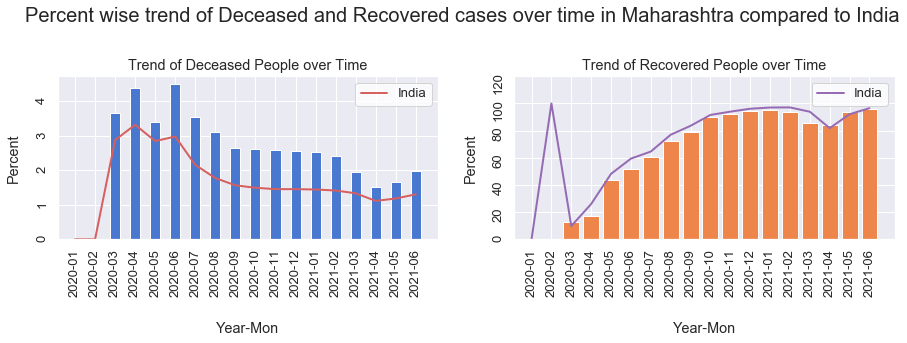

In [27]:
## As a sample, test case numbers for Maharashtra and comparing them to National Average over time
dec_rec_plotter('Maharashtra')

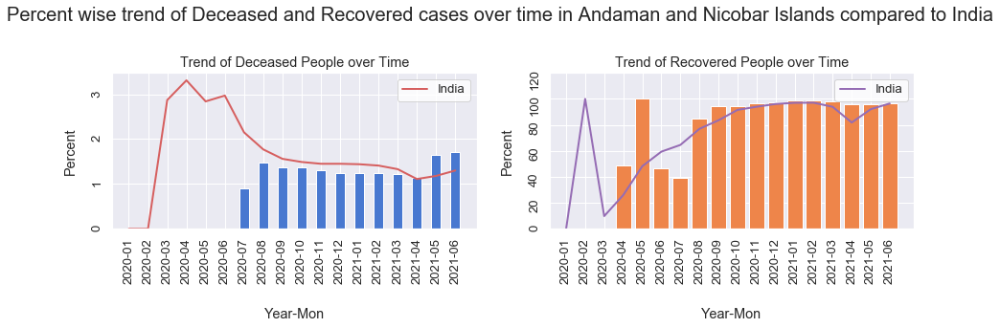

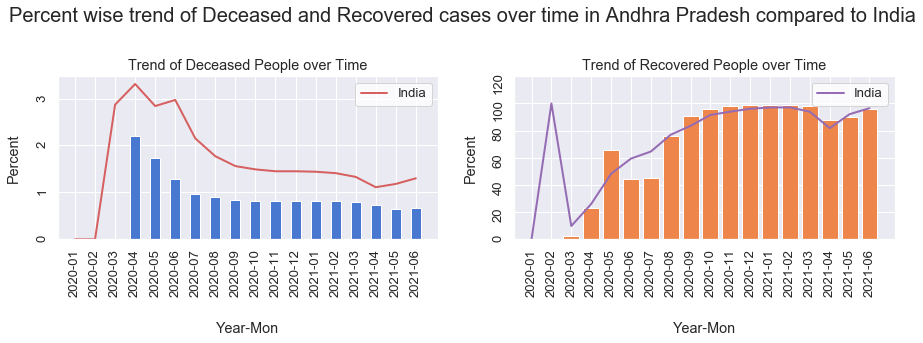

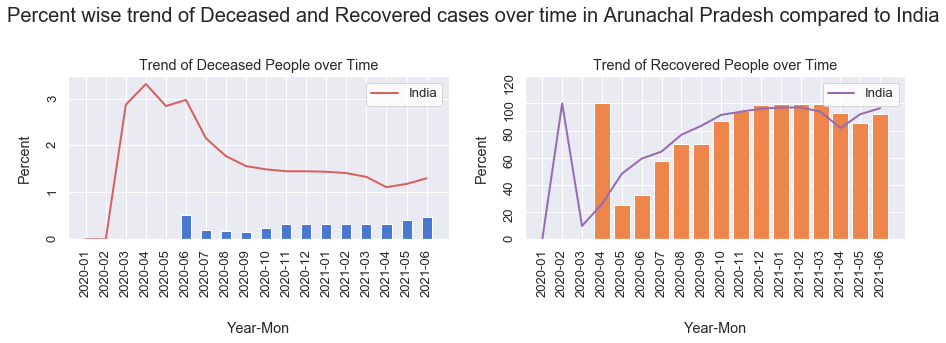

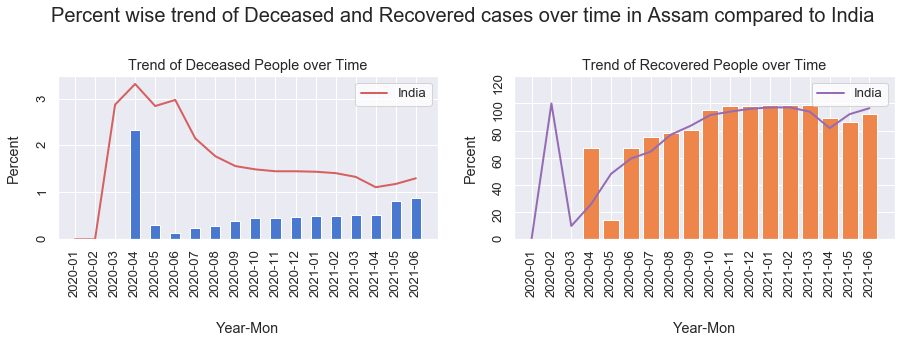

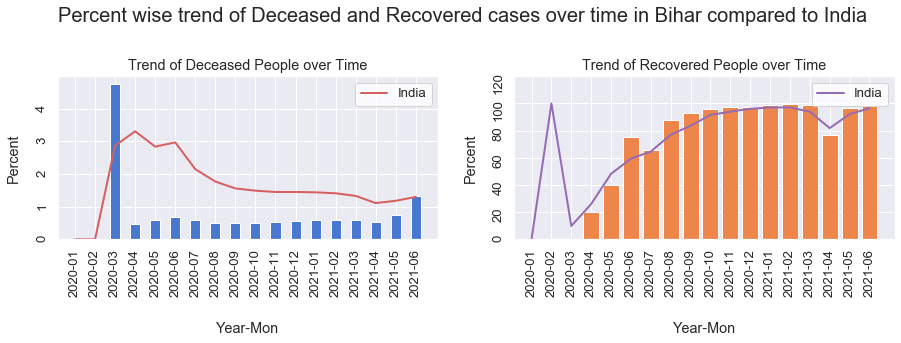

...

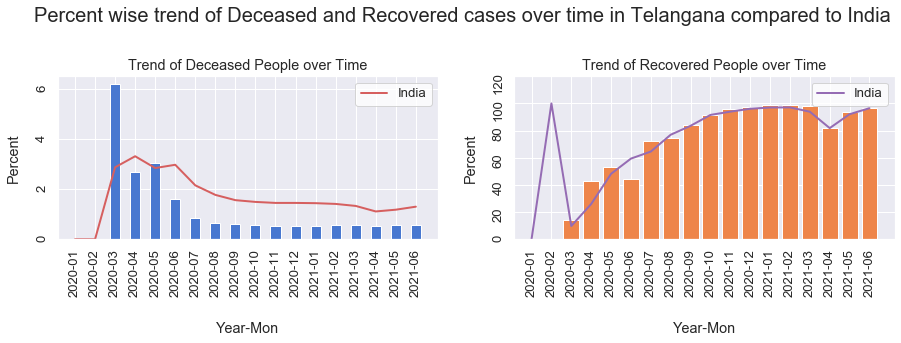

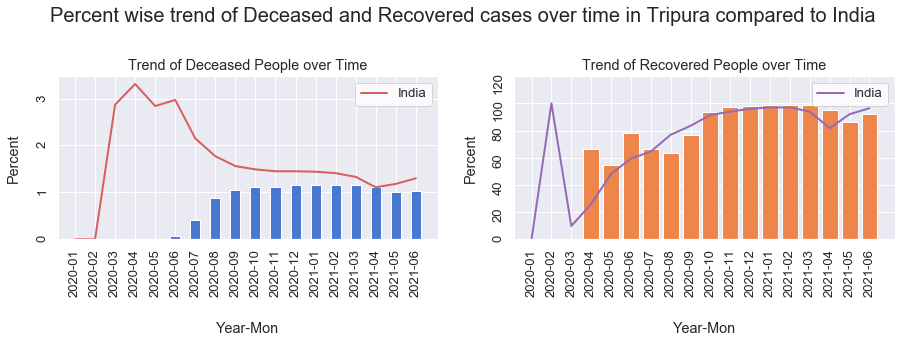

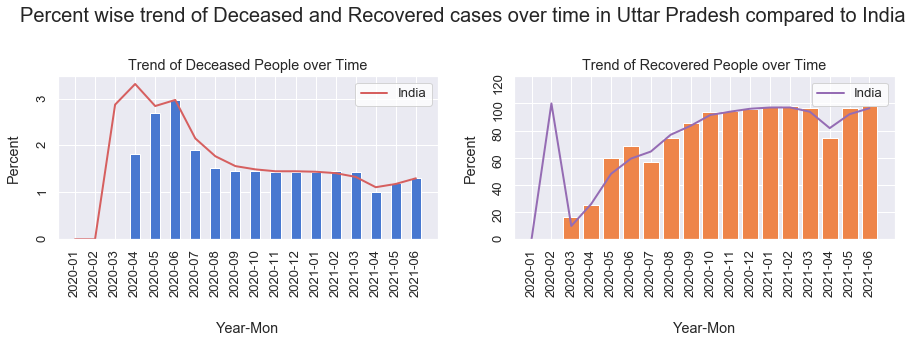

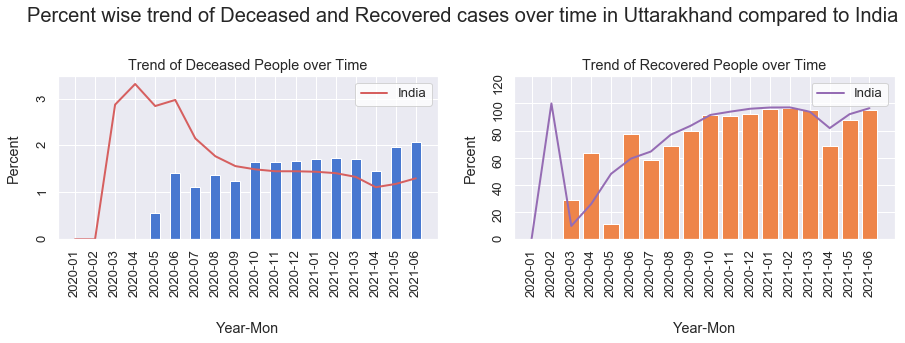

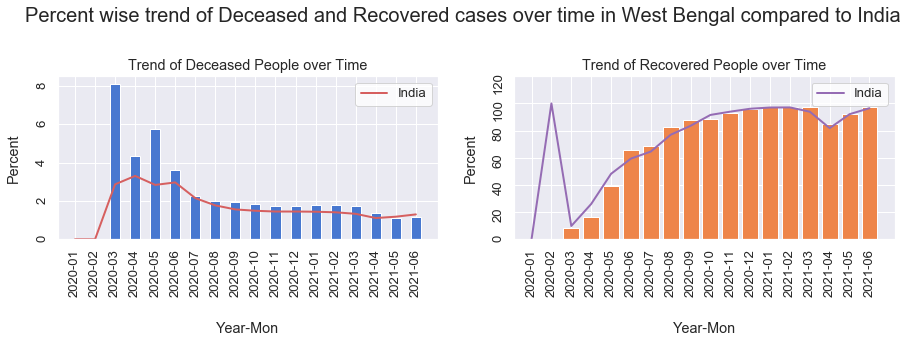

In [28]:
## Plotting trend of Recovered and Death Percentages over time for every State and UT
for state in states:
    print('\n')
    dec_rec_plotter(state)

# 2. Covid Vaccinations Data

## Data Exporation

In [29]:
## Read the vaccinations data from Covid API
vac = pd.read_csv("http://api.covid19india.org/csv/latest/cowin_vaccine_data_statewise.csv")
vac.head()

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,Total Sputnik V Administered,AEFI,18-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,NaN,NaN,NaN,NaN,NaN,48276.0
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,NaN,NaN,NaN,NaN,NaN,58604.0
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,NaN,NaN,NaN,NaN,NaN,99449.0
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,NaN,NaN,NaN,NaN,NaN,195525.0
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,NaN,NaN,NaN,NaN,NaN,251280.0


In [30]:
## Keeping ony granular detail columns which can be used to generate aggrgated ones whenever needed
vac = vac[['Updated On', 'State', 'Total Covaxin Administered', 'Total CoviShield Administered', 
           'Total Sputnik V Administered', 'First Dose Administered', 'Second Dose Administered', 
           '18-45 years (Age)', '45-60 years (Age)', '60+ years (Age)']]
vac.head()

,Updated On,State,Total Covaxin Administered,Total CoviShield Administered,Total Sputnik V Administered,First Dose Administered,Second Dose Administered,18-45 years (Age),45-60 years (Age),60+ years (Age)
0,16/01/2021,India,579.0,47697.0,NaN,48276.0,0.0,NaN,NaN,NaN
1,17/01/2021,India,635.0,57969.0,NaN,58604.0,0.0,NaN,NaN,NaN
2,18/01/2021,India,1299.0,98150.0,NaN,99449.0,0.0,NaN,NaN,NaN
3,19/01/2021,India,3017.0,192508.0,NaN,195525.0,0.0,NaN,NaN,NaN
4,20/01/2021,India,3946.0,247334.0,NaN,251280.0,0.0,NaN,NaN,NaN


In [31]:
## Change type of Date column
vac['Updated On'] = pd.to_datetime(vac['Updated On'],format='%d/%m/%Y')
vac.dtypes

Updated On                       datetime64[ns]
State                                    object
Total Covaxin Administered              float64
Total CoviShield Administered           float64
Total Sputnik V Administered            float64
First Dose Administered                 float64
Second Dose Administered                float64
18-45 years (Age)                       float64
45-60 years (Age)                       float64
60+ years (Age)                         float64
dtype: object

In [32]:
## Drop rows with na threshold of 5 and check for NA values
vac.dropna(thresh=5,inplace=True)
vac.isna().sum()

Updated On                          0
State                               0
Total Covaxin Administered          0
Total CoviShield Administered       0
Total Sputnik V Administered     4626
First Dose Administered             0
Second Dose Administered            0
18-45 years (Age)                2186
45-60 years (Age)                2185
60+ years (Age)                  2185
dtype: int64

## Data Processing
##### Since provided data is a time series and we want to analyze the daily numbers, we need to nullify the cummulative values  

In [33]:
## Defining a function that takes a cumulative series and returns the original one
def nullify_cummulative(ser):
    
    ## The first element will remain the same in the original list as well
    orig = [ser[0]]
    
    ## For every subsequeent entry, substract the previous one to get original value and append it to original list
    for i in range(1,len(ser)):
        orig.append(ser[i]-ser[i-1])
        
    ## Return the original series
    return orig

In [34]:
## Creating an empty dataframe that will contain the original values (not cummulated) for all metrics 
mod_df = pd.DataFrame()

## Run the loop on a State based Grouped object and sort each of them by date inside the group
for name, df in vac.groupby('State',as_index=False):
    df.sort_values('Updated On',inplace=True)
    df.reset_index(drop=True,inplace=True)
    
    ## We'll fill inital null values of cumulative series with 0
    ## And if there are any null value amidst the cummulative series, we'll fill those by its previous observation
    for col in df.columns[2:]:
        df.loc[:df[col].first_valid_index()-1,col] = 0
        df[col].fillna(method='ffill',inplace=True)  
    
    ## Now, we don't have any null values thus we can perform our cummulative nullifying action
    orig_values = df.iloc[:,2:].apply(nullify_cummulative)
    orig_values = orig_values.applymap(int)

    ## Combine the numeric columns with Date and State to get the final modified dataframe
    vaccine_orig = pd.concat([df.iloc[:,:2],orig_values],axis=1)
    mod_df = mod_df.append(vaccine_orig)   

## Check the final modified dataframe
mod_df.reset_index(drop=True,inplace=True)
mod_df.head()

,Updated On,State,Total Covaxin Administered,Total CoviShield Administered,Total Sputnik V Administered,First Dose Administered,Second Dose Administered,18-45 years (Age),45-60 years (Age),60+ years (Age)
0,2021-01-16,Andaman and Nicobar Islands,0,23,0,23,0,0,0,0
1,2021-01-17,Andaman and Nicobar Islands,0,0,0,0,0,0,0,0
2,2021-01-18,Andaman and Nicobar Islands,0,19,0,19,0,0,0,0
3,2021-01-19,Andaman and Nicobar Islands,0,47,0,47,0,0,0,0
4,2021-01-20,Andaman and Nicobar Islands,0,35,0,35,0,0,0,0


In [35]:
## Check the modified dataframe for any null values
mod_df.isna().sum()

Updated On                       0
State                            0
Total Covaxin Administered       0
Total CoviShield Administered    0
Total Sputnik V Administered     0
First Dose Administered          0
Second Dose Administered         0
18-45 years (Age)                0
45-60 years (Age)                0
60+ years (Age)                  0
dtype: int64

In [83]:
mod_df = mod_df[mod_df['Updated On'] < dt.datetime.today()-dt.timedelta(days=2)].shape

(5735, 10)

## a. Daily Vaccination jabs by Drug Brands

In [57]:
## Define a function to plot daily vaccination jabs by Drug Brands
def daily_vaccination_plotter_by_drug_brand(state):
    
    ## Filter for State and find the most latest observation and print the summary numbers of vaccines administered till date 
    df = vac[vac['State']==state]
    last_entry = df[df['Updated On'] == df['Updated On'].max()]
    
    str_to_print = '        '+state+' as of '+last_entry['Updated On'].iloc[0].strftime("%d-%b-%Y")+': '+\
        ' CoviShield '+'{:,}'.format(int(last_entry['Total CoviShield Administered'].iloc[0]))+'; '+\
        ' Covaxin '+'{:,}'.format(int(last_entry['Total Covaxin Administered'].iloc[0]))+'; '+\
        ' Sputnik '+'{:,}'.format(int(last_entry['Total Sputnik V Administered'].iloc[0]))+'; '+\
        ' Total '+'{:,}'.format(int(last_entry['Total CoviShield Administered'].iloc[0] +\
                                     last_entry['Total Covaxin Administered'].iloc[0] +\
                                     last_entry['Total Sputnik V Administered'].iloc[0]))
    print(str_to_print.center(width))
    
    ## Filter for State and summarize daily numbers on weekly level
    state_df = mod_df[mod_df['State']==state]
    data = state_df.resample('W',on='Updated On').sum()
    data.reset_index(inplace=True)

    ## Creating plots
    fig, ax = plt.subplots(figsize=(15,5))

    ## Plots for Daily Administered Doses of CoviShield and Covaxin over time
    ax.bar(mdates.date2num(data['Updated On'])-0.75,data['Total CoviShield Administered'],label='Covishield',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+0.75,data['Total Covaxin Administered'],label='Covaxin',width=1.5)
    plt.legend(loc=1,facecolor='White')

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%d-%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1,byweekday=(2)))
    _, y_top = ax.get_ylim()
    ax.set_ylim(top=max(data['Total CoviShield Administered'])*1.25)
    
    ## Using a loop to plot text for all the points of each of the 2 bar lines
    for i in range(len(data)):
        ax.text(mdates.date2num(data['Updated On'].iloc[i])-1.3,  y_top/40 + data['Total CoviShield Administered'].iloc[i], '{:,}'.format(data['Total CoviShield Administered'].iloc[i]), rotation=90, size = 9)
        ax.text(mdates.date2num(data['Updated On'].iloc[i])+0.45, y_top/40 + data['Total Covaxin Administered'].iloc[i],       '{:,}'.format(data['Total Covaxin Administered'].iloc[i]),    rotation=90, size = 9)

    ## Adding labels
    fig.autofmt_xdate()
    plt.xlabel('Timeline',labelpad=10)
    plt.ylabel('Number of Vaccines',labelpad=10)
    plt.title('Daily Vaccinations by drug brand in '+state)
    plt.show()

        India as of 21-Jun-2021:  CoviShield 249,725,103;  Covaxin 34,123,378;  Sputnik 43,283;  Total 283,891,764


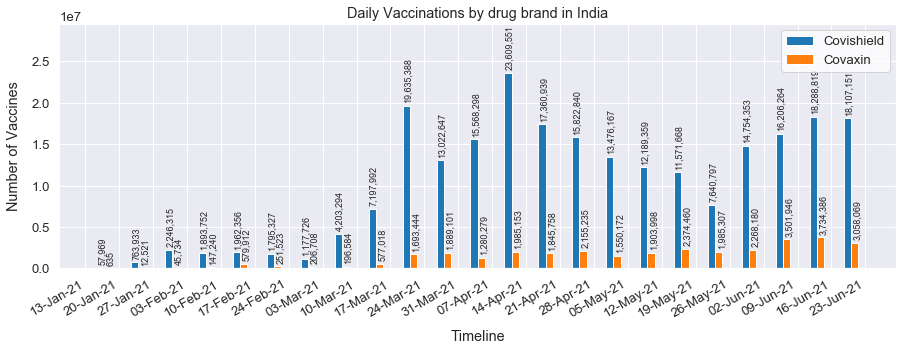

In [58]:
## Plotting daily vaccination jabs by Drug Brands for India as a whole
daily_vaccination_plotter_by_drug_brand('India')

        Andaman and Nicobar Islands as of 21-Jun-2021:  CoviShield 137,495;  Covaxin 0;  Sputnik 0;  Total 137,495


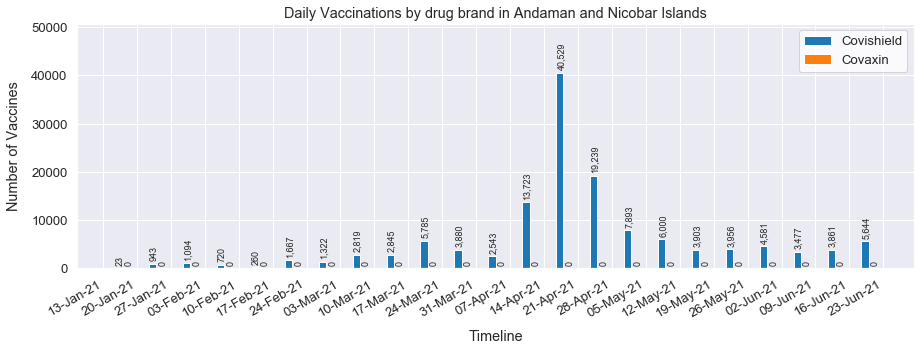

        Andhra Pradesh as of 21-Jun-2021:  CoviShield 11,732,994;  Covaxin 2,272,590;  Sputnik 5,579;  Total 14,011,163


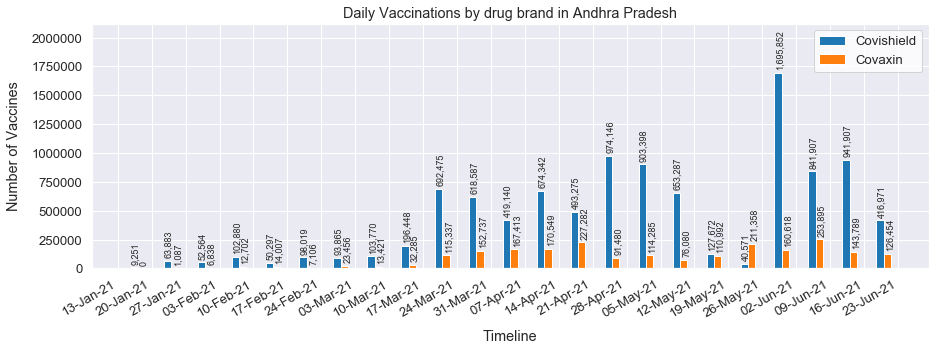

        Arunachal Pradesh as of 21-Jun-2021:  CoviShield 494,030;  Covaxin 0;  Sputnik 0;  Total 494,030


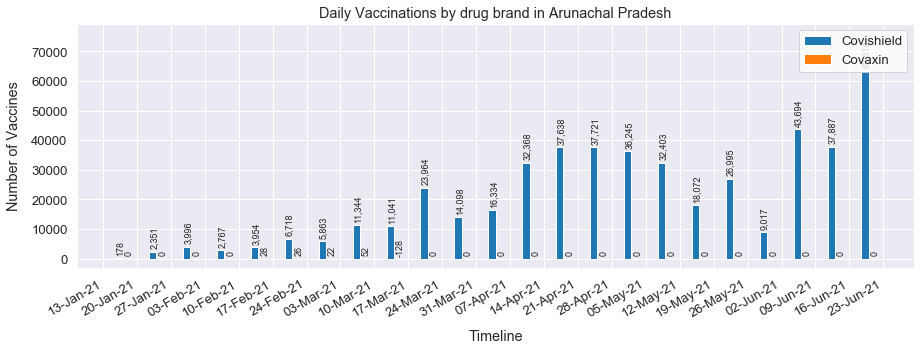

        Assam as of 21-Jun-2021:  CoviShield 4,659,204;  Covaxin 1,062,023;  Sputnik 0;  Total 5,721,227


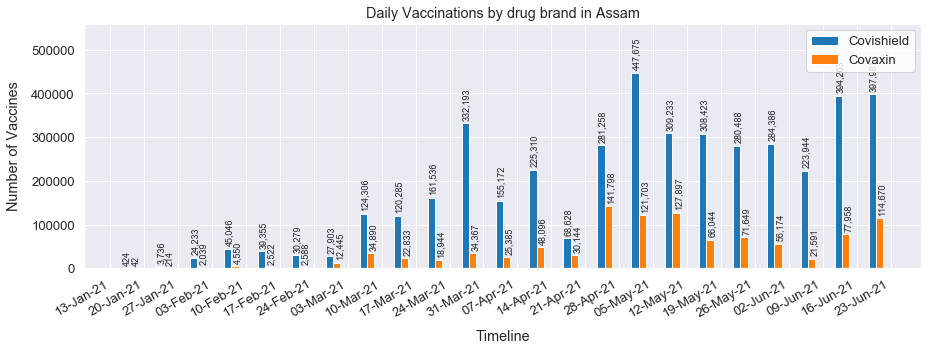

        Bihar as of 21-Jun-2021:  CoviShield 12,847,172;  Covaxin 1,387,886;  Sputnik 0;  Total 14,235,058


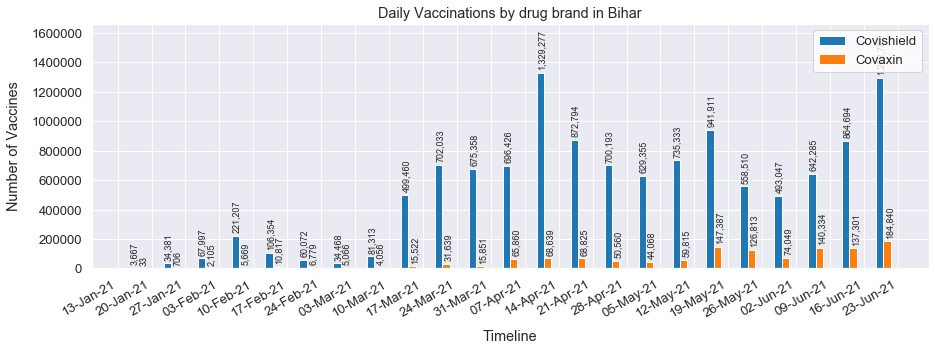

        Chandigarh as of 21-Jun-2021:  CoviShield 460,036;  Covaxin 390;  Sputnik 0;  Total 460,426


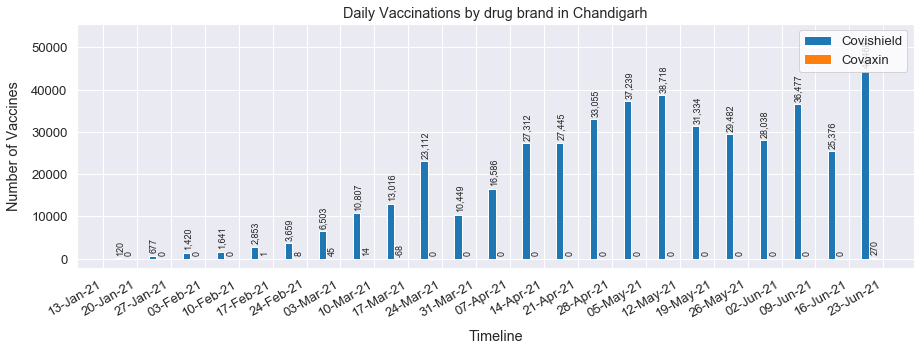

        Chhattisgarh as of 21-Jun-2021:  CoviShield 6,228,633;  Covaxin 251,667;  Sputnik 79;  Total 6,480,379


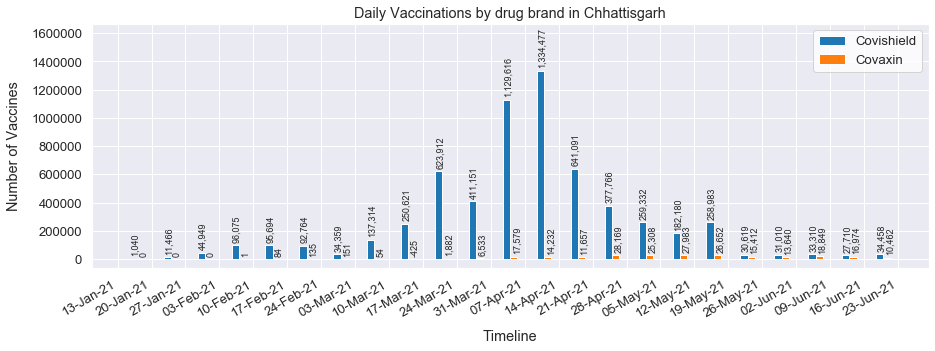

        Dadra and Nagar Haveli and Daman and Diu as of 21-Jun-2021:  CoviShield 317,255;  Covaxin 12;  Sputnik 0;  Total 317,267


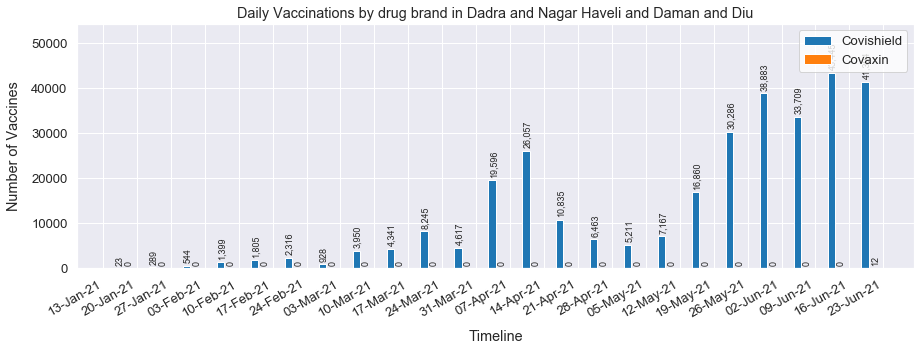

        Delhi as of 21-Jun-2021:  CoviShield 4,611,564;  Covaxin 1,998,961;  Sputnik 709;  Total 6,611,234


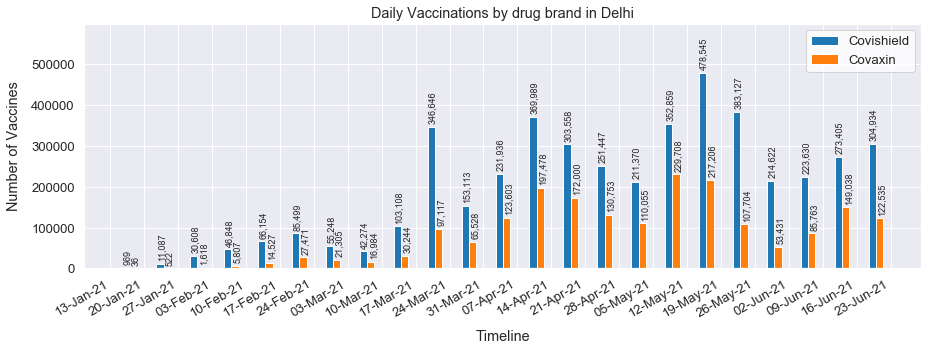

        Goa as of 21-Jun-2021:  CoviShield 759,888;  Covaxin 16,210;  Sputnik 0;  Total 776,098


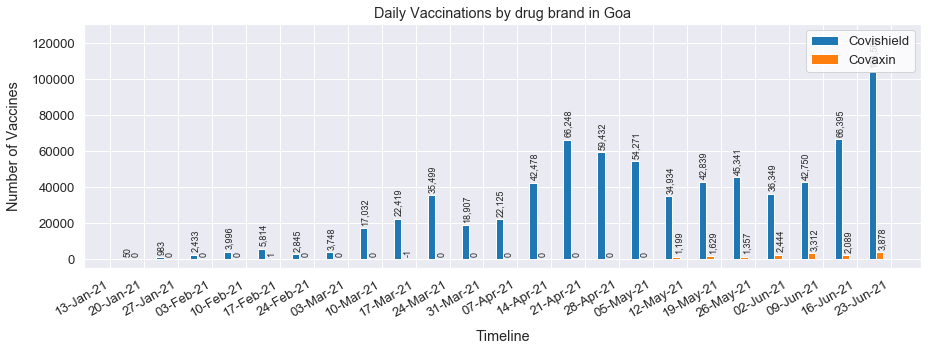

        Gujarat as of 21-Jun-2021:  CoviShield 20,039,576;  Covaxin 2,580,075;  Sputnik 0;  Total 22,619,651


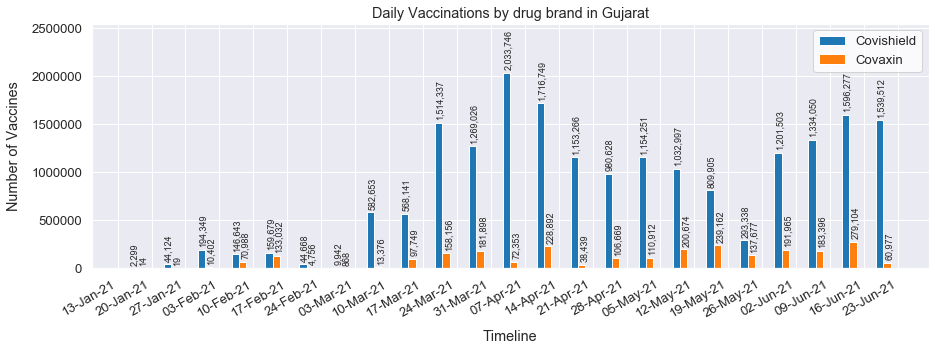

        Haryana as of 21-Jun-2021:  CoviShield 6,713,327;  Covaxin 1,166,483;  Sputnik 15;  Total 7,879,825


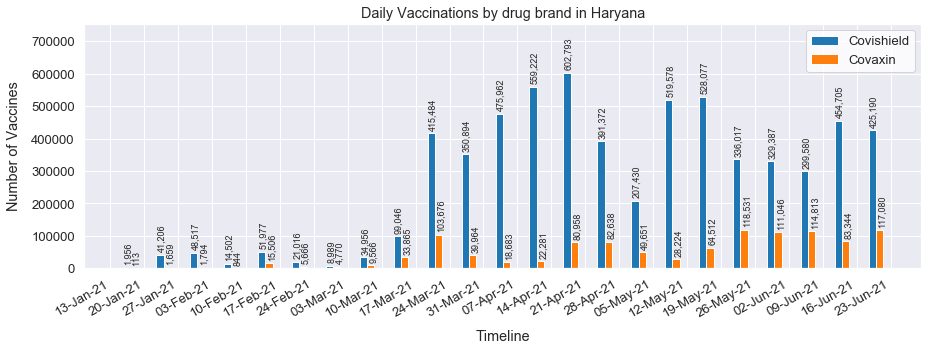

        Himachal Pradesh as of 21-Jun-2021:  CoviShield 2,916,811;  Covaxin 413;  Sputnik 1,500;  Total 2,918,724


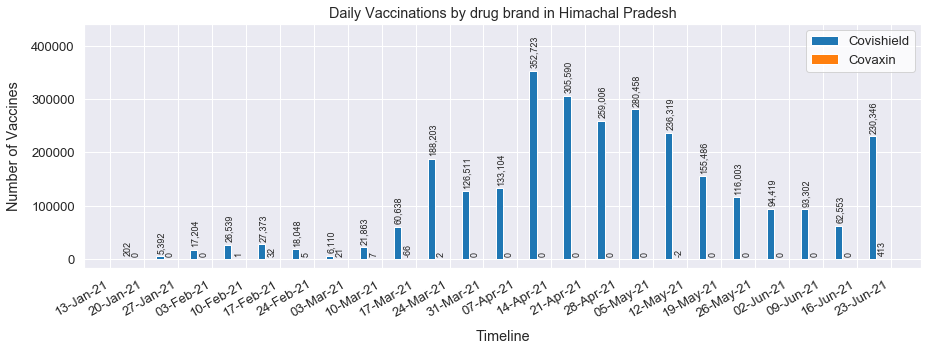

        Jammu and Kashmir as of 21-Jun-2021:  CoviShield 3,927,484;  Covaxin 81,727;  Sputnik 0;  Total 4,009,211


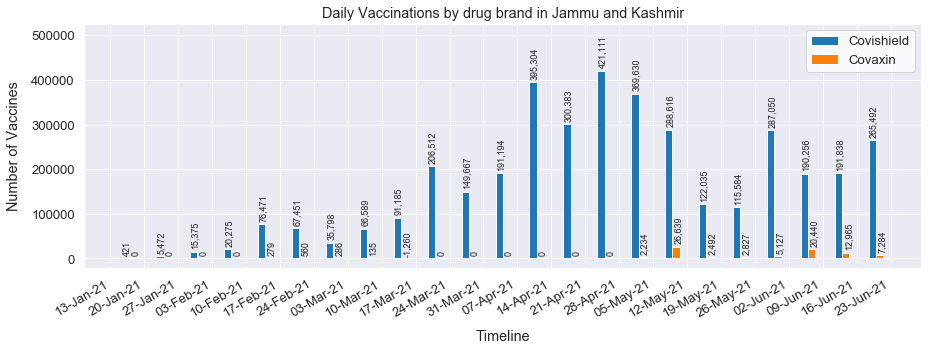

        Jharkhand as of 21-Jun-2021:  CoviShield 5,036,044;  Covaxin 847,517;  Sputnik 0;  Total 5,883,561


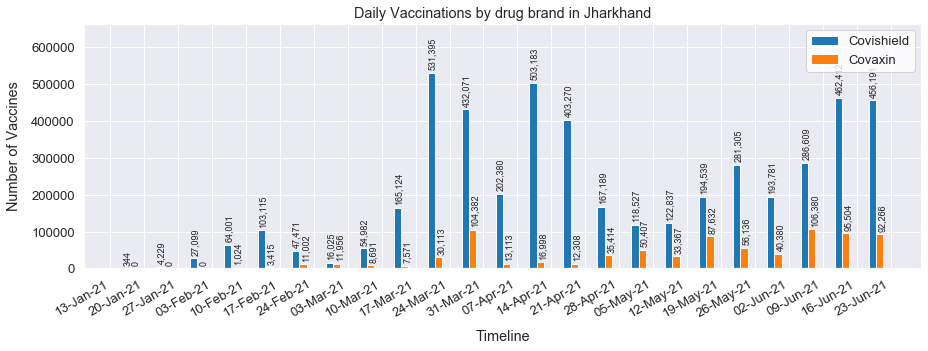

        Karnataka as of 21-Jun-2021:  CoviShield 17,571,984;  Covaxin 2,079,183;  Sputnik 1,592;  Total 19,652,759


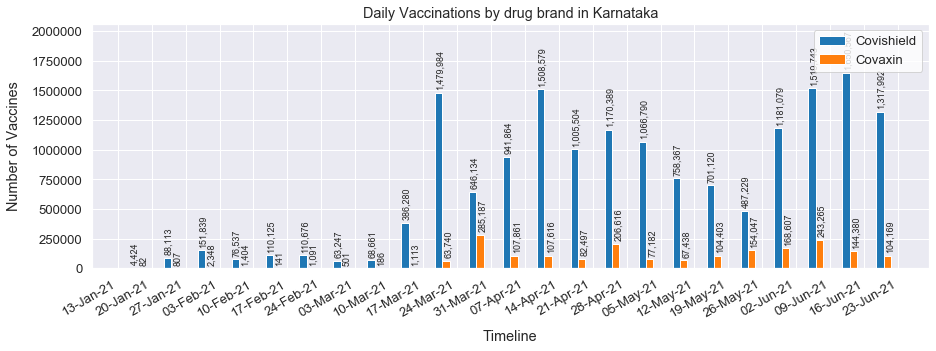

        Kerala as of 21-Jun-2021:  CoviShield 11,339,002;  Covaxin 1,092,178;  Sputnik 22;  Total 12,431,202


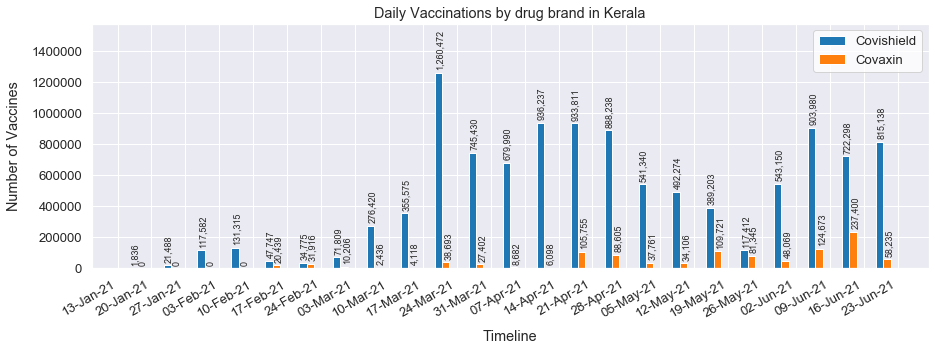

        Ladakh as of 21-Jun-2021:  CoviShield 200,706;  Covaxin 0;  Sputnik 0;  Total 200,706


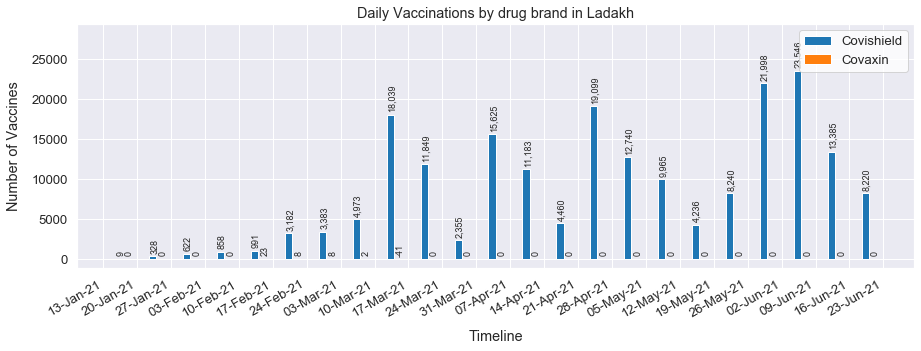

        Lakshadweep as of 21-Jun-2021:  CoviShield 52,001;  Covaxin 0;  Sputnik 0;  Total 52,001


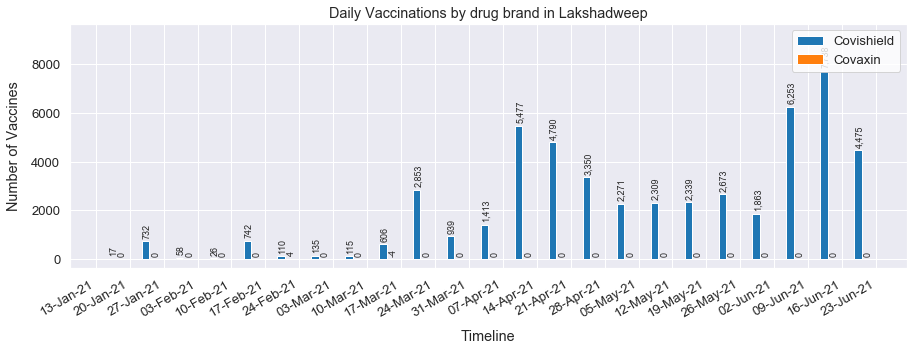

        Madhya Pradesh as of 21-Jun-2021:  CoviShield 14,638,549;  Covaxin 2,094,649;  Sputnik 0;  Total 16,733,198


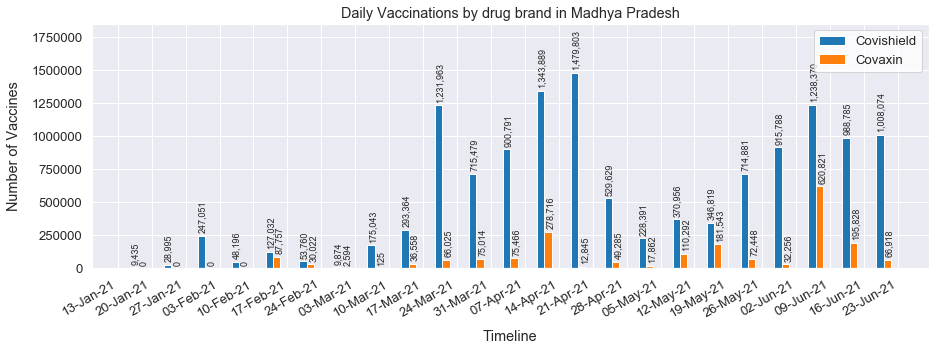

        Maharashtra as of 21-Jun-2021:  CoviShield 24,671,721;  Covaxin 3,455,691;  Sputnik 1,356;  Total 28,128,768


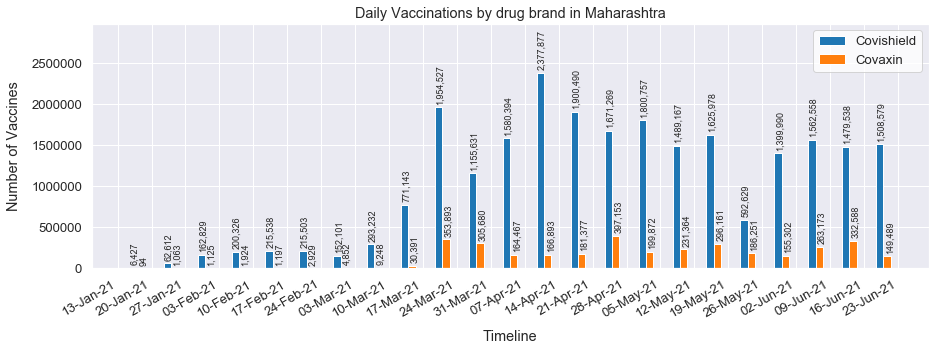

        Manipur as of 21-Jun-2021:  CoviShield 572,397;  Covaxin 0;  Sputnik 0;  Total 572,397


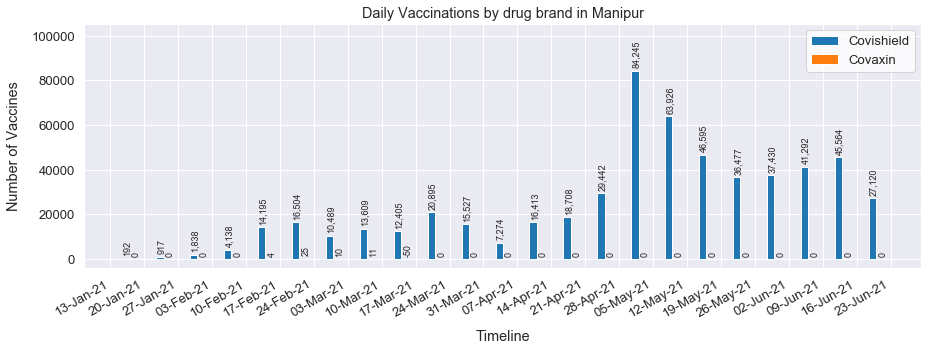

        Meghalaya as of 21-Jun-2021:  CoviShield 604,195;  Covaxin 0;  Sputnik 0;  Total 604,195


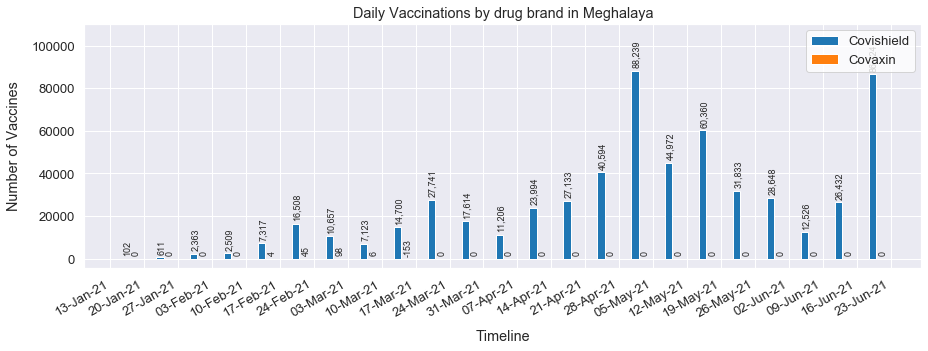

        Mizoram as of 21-Jun-2021:  CoviShield 445,820;  Covaxin 0;  Sputnik 0;  Total 445,820


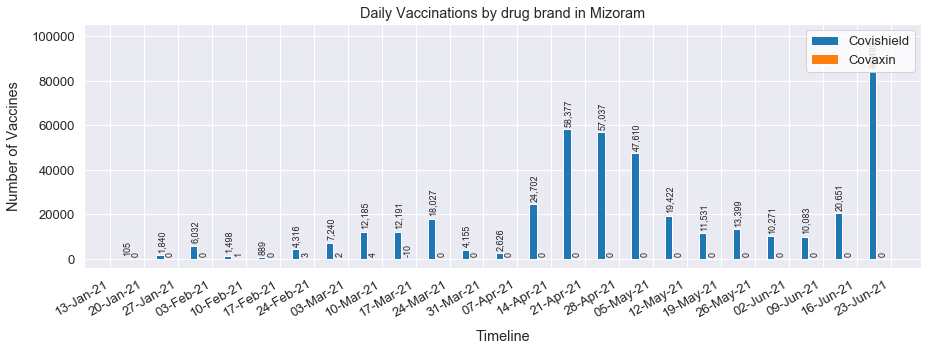

        Nagaland as of 21-Jun-2021:  CoviShield 409,572;  Covaxin 0;  Sputnik 0;  Total 409,572


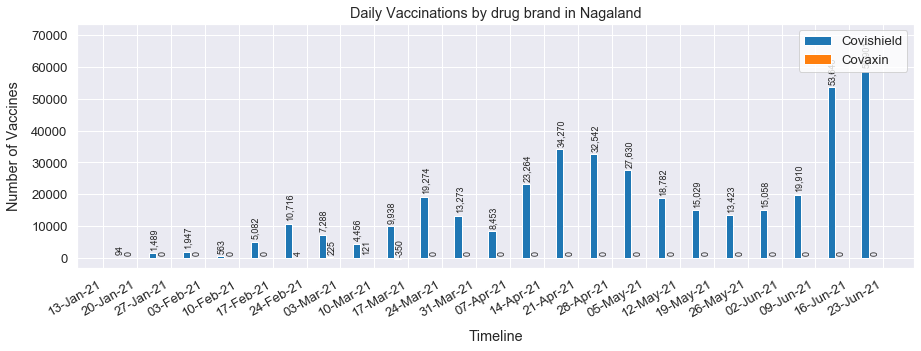

        Odisha as of 21-Jun-2021:  CoviShield 8,969,710;  Covaxin 1,179,838;  Sputnik 0;  Total 10,149,548


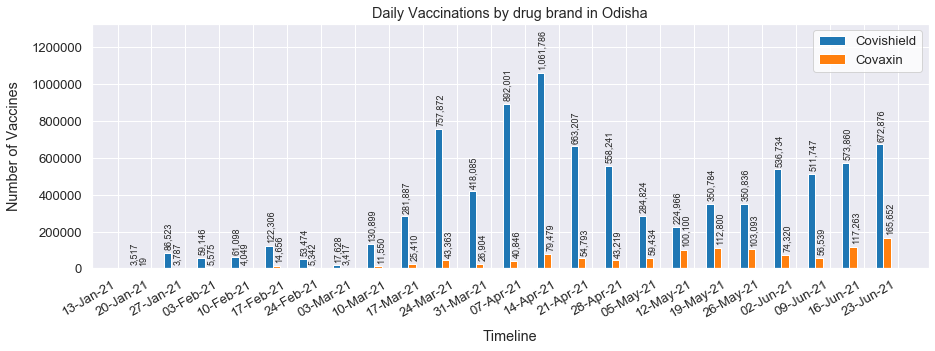

        Puducherry as of 21-Jun-2021:  CoviShield 436,497;  Covaxin 74;  Sputnik 0;  Total 436,571


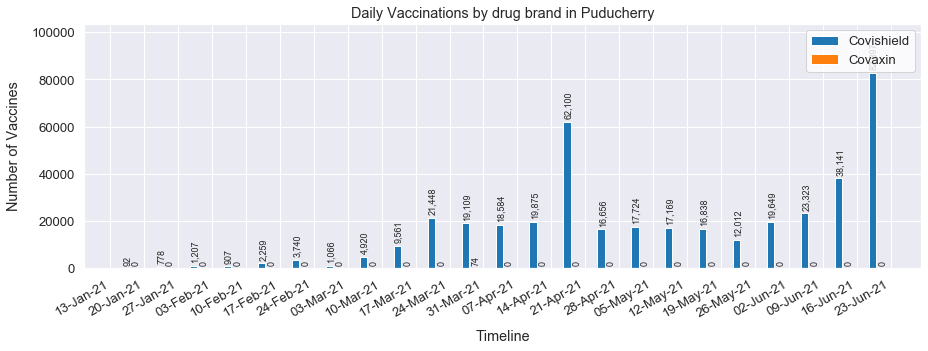

        Punjab as of 21-Jun-2021:  CoviShield 4,978,312;  Covaxin 543,657;  Sputnik 25;  Total 5,521,994


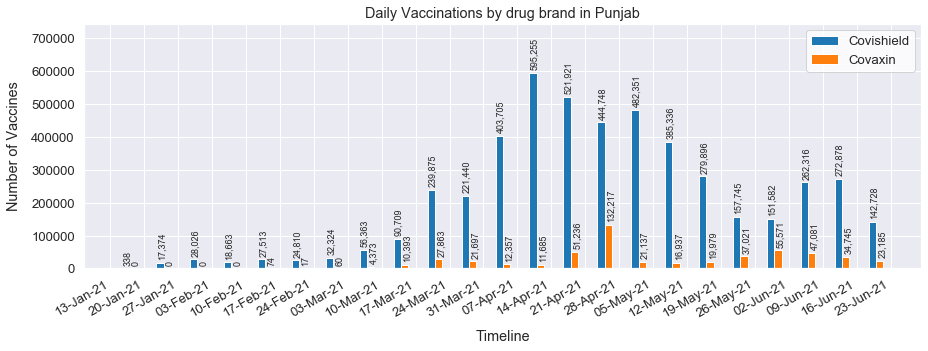

        Rajasthan as of 21-Jun-2021:  CoviShield 19,485,515;  Covaxin 2,227,529;  Sputnik 0;  Total 21,713,044


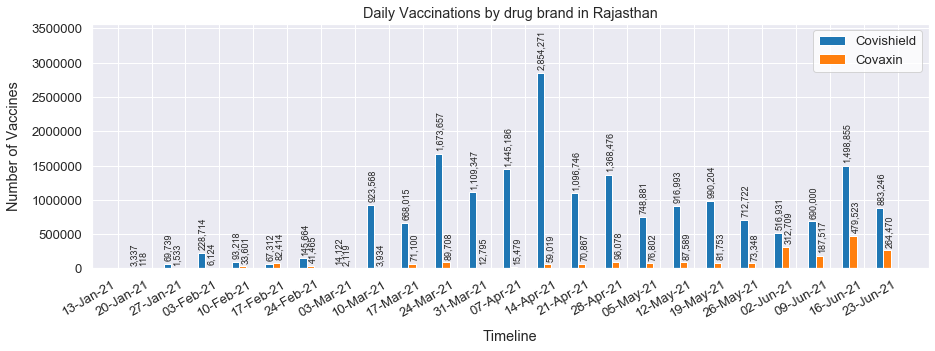

        Sikkim as of 21-Jun-2021:  CoviShield 371,403;  Covaxin 0;  Sputnik 0;  Total 371,403


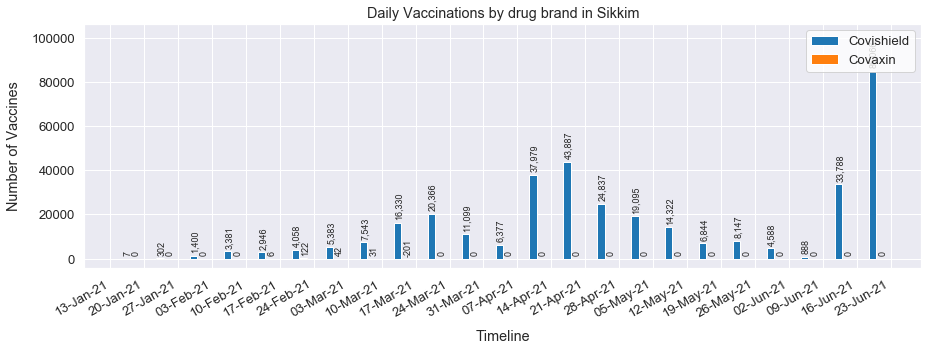

        Tamil Nadu as of 21-Jun-2021:  CoviShield 10,947,148;  Covaxin 2,159,078;  Sputnik 440;  Total 13,106,666


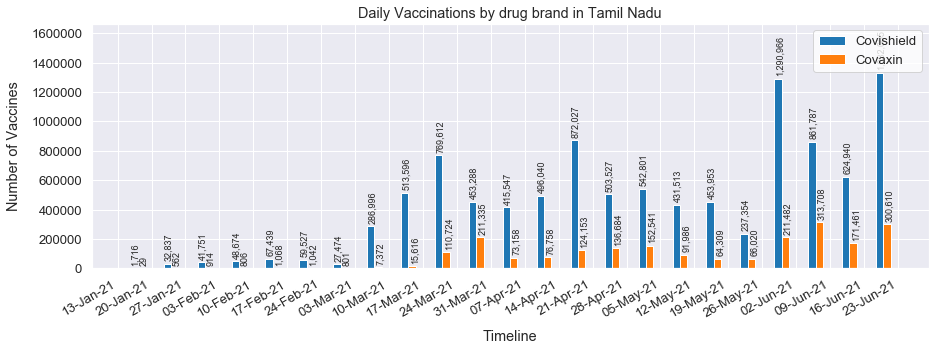

        Telangana as of 21-Jun-2021:  CoviShield 7,514,259;  Covaxin 1,783,499;  Sputnik 29,810;  Total 9,327,568


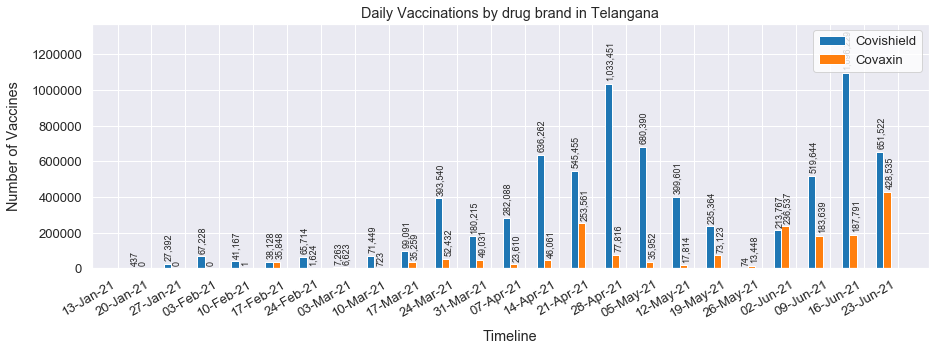

        Tripura as of 21-Jun-2021:  CoviShield 2,068,186;  Covaxin 25,065;  Sputnik 0;  Total 2,093,251


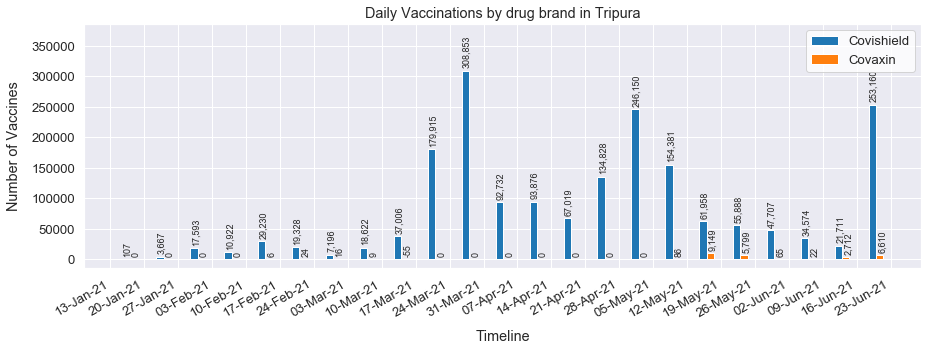

        Uttar Pradesh as of 21-Jun-2021:  CoviShield 23,128,661;  Covaxin 3,230,749;  Sputnik 0;  Total 26,359,410


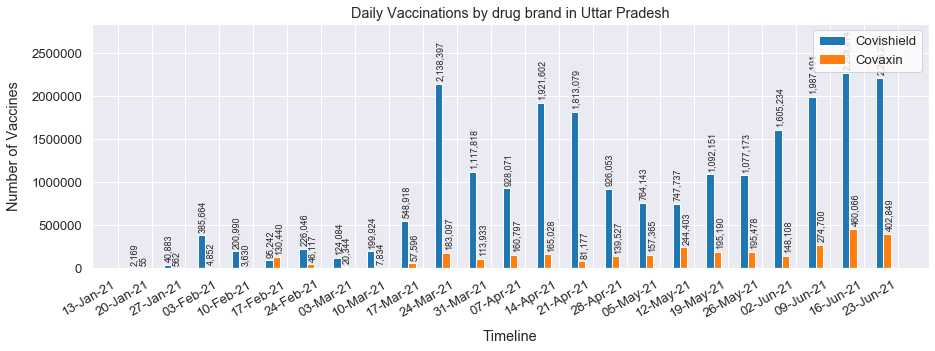

        Uttarakhand as of 21-Jun-2021:  CoviShield 3,480,442;  Covaxin 196,058;  Sputnik 0;  Total 3,676,500


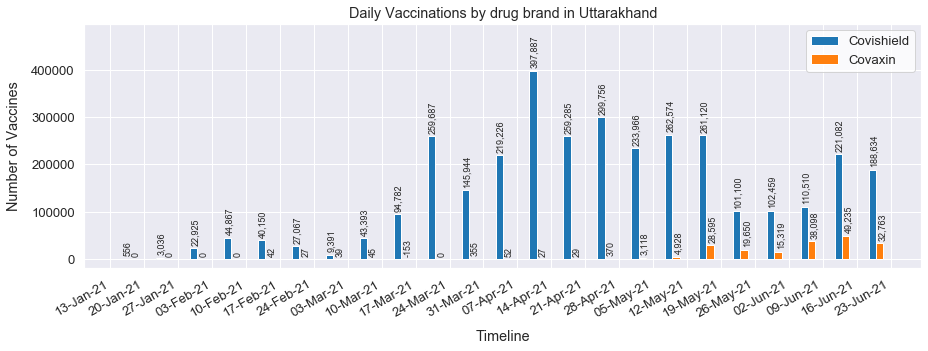

        West Bengal as of 21-Jun-2021:  CoviShield 16,957,510;  Covaxin 2,390,176;  Sputnik 2,156;  Total 19,349,842


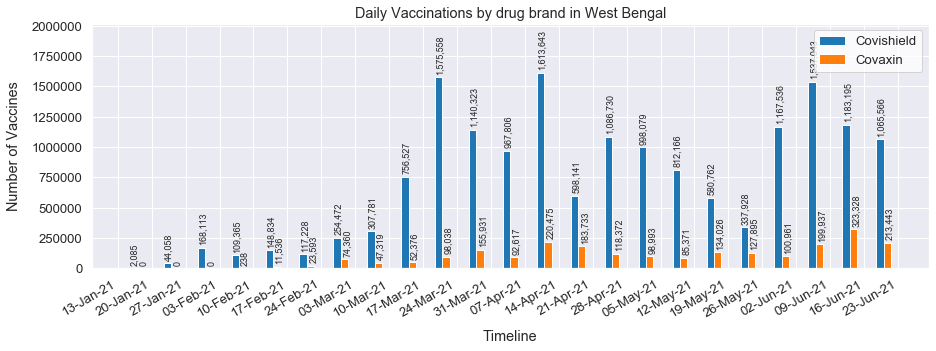

In [59]:
## Plotting daily vaccination jabs by Drug Brands for every State and UT
for state in states:
    daily_vaccination_plotter_by_drug_brand(state)

## b. Daily Vaccination jabs by Dose Number

In [70]:
## Define a function to plot daily vaccination jabs by Dose number
def daily_vaccination_plotter_by_dose_number(state):
    
    ## Filter for State and find the most latest observation and print the summary numbers of vaccines till date
    df = vac[vac['State']==state]
    last_entry = df[df['Updated On'] == df['Updated On'].max()]
    str_to_print = '       '+state+' as of '+last_entry['Updated On'].iloc[0].strftime("%d-%b-%Y")+': '+\
        ' First-Dose '+'{:,}'.format(int(last_entry['First Dose Administered'].iloc[0]))+'; '+\
        ' Second-Dose '+'{:,}'.format(int(last_entry['Second Dose Administered'].iloc[0]))+'; '+\
        ' Total Doses '+'{:,}'.format(int(last_entry['First Dose Administered'].iloc[0] +\
                                         last_entry['Second Dose Administered'].iloc[0]))
    print(str_to_print.center(width))
    
    ## Filter for State and summarize daily numbers on weekly level
    state_df = mod_df[mod_df['State']==state]
    data = state_df.resample('W',on='Updated On').sum()
    data.reset_index(inplace=True)
    
    ## Creating plots
    fig, ax = plt.subplots(figsize=(15,5))

    ## Plots for Daily Administered First and Second Doses over time
    ax.bar(mdates.date2num(data['Updated On'])-0.75,data['First Dose Administered'],label='First Dose',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+0.75,data['Second Dose Administered'],label='Second Dose',width=1.5)
    plt.legend(loc=1,facecolor='White')

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%d-%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1,byweekday=(2)))
    ax.set_ylim(top=max(data['First Dose Administered'])*1.25)
    _, y_top = ax.get_ylim()

    ## Using a loop to plot text for all the points of both the trend lines
    for i in range(len(data)):
        ax.text(mdates.date2num(data['Updated On'].iloc[i])-1.3,  y_top/40 + data['First Dose Administered'].iloc[i], '{:,}'.format(data['First Dose Administered'].iloc[i]), rotation=90, size = 9)
        ax.text(mdates.date2num(data['Updated On'].iloc[i])+0.45, y_top/40 + data['Second Dose Administered'].iloc[i],   '{:,}'.format(data['Second Dose Administered'].iloc[i]),    rotation=90, size = 9)

    ## Adding labels
    fig.autofmt_xdate()
    plt.xlabel('Timeline',labelpad=10)
    plt.ylabel('Number of Vaccines',labelpad=10)
    plt.title('Daily Vaccinations by dose number in '+state)
    plt.show()

       India as of 21-Jun-2021:  First-Dose 233,288,807;  Second-Dose 50,602,957;  Total Doses 283,891,764


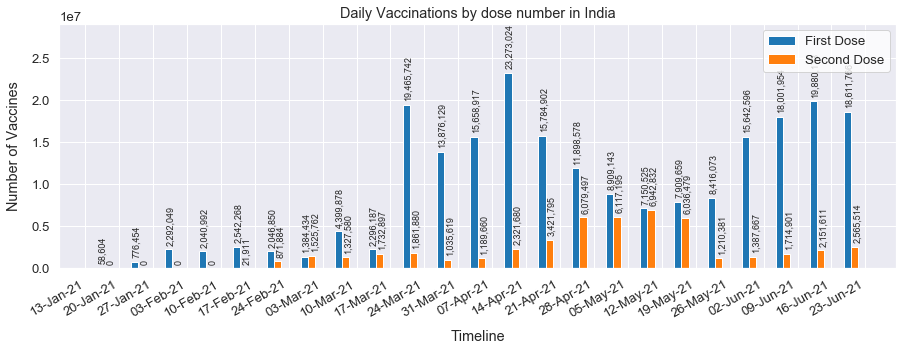

In [71]:
## Plotting daily vaccination jabs by Dose number for India as a whole
daily_vaccination_plotter_by_dose_number('India')

       Andaman and Nicobar Islands as of 21-Jun-2021:  First-Dose 121,964;  Second-Dose 15,531;  Total Doses 137,495


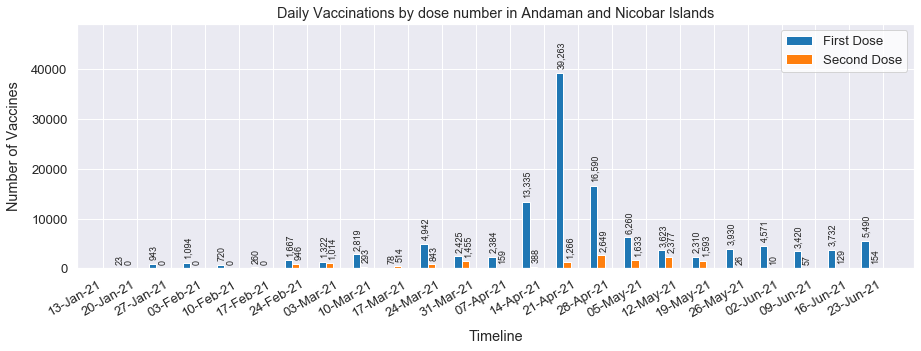

       Andhra Pradesh as of 21-Jun-2021:  First-Dose 11,265,333;  Second-Dose 2,745,830;  Total Doses 14,011,163


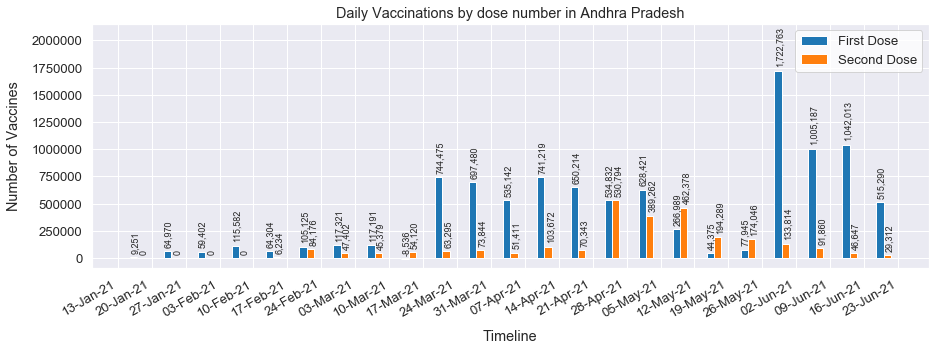

       Arunachal Pradesh as of 21-Jun-2021:  First-Dose 414,267;  Second-Dose 79,763;  Total Doses 494,030


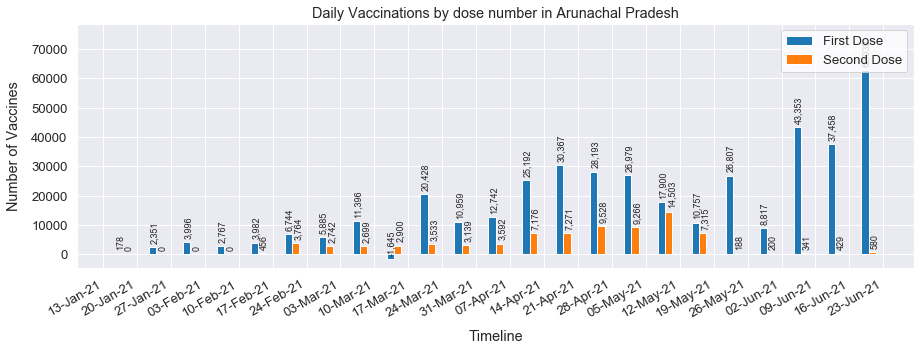

       Assam as of 21-Jun-2021:  First-Dose 4,635,279;  Second-Dose 1,085,948;  Total Doses 5,721,227


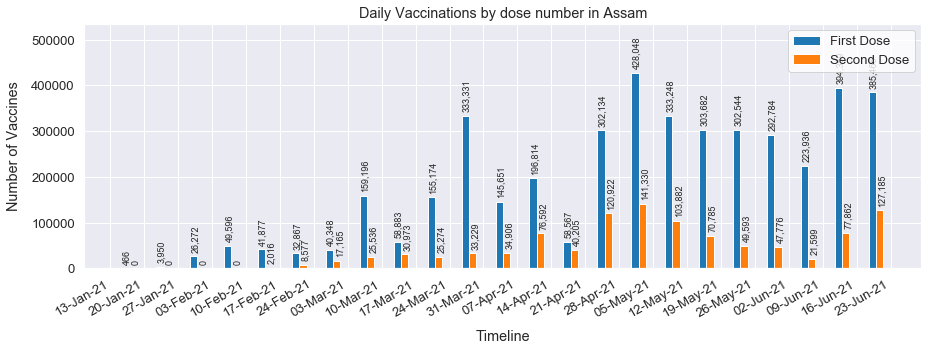

       Bihar as of 21-Jun-2021:  First-Dose 12,161,634;  Second-Dose 2,073,424;  Total Doses 14,235,058


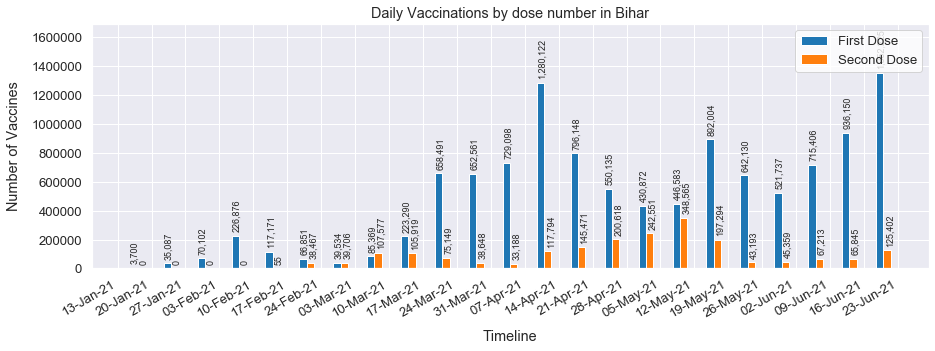

       Chandigarh as of 21-Jun-2021:  First-Dose 382,966;  Second-Dose 77,460;  Total Doses 460,426


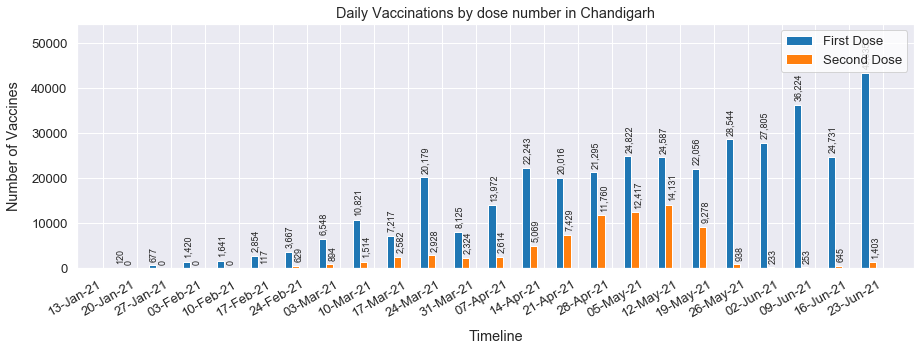

       Chhattisgarh as of 21-Jun-2021:  First-Dose 5,278,123;  Second-Dose 1,202,256;  Total Doses 6,480,379


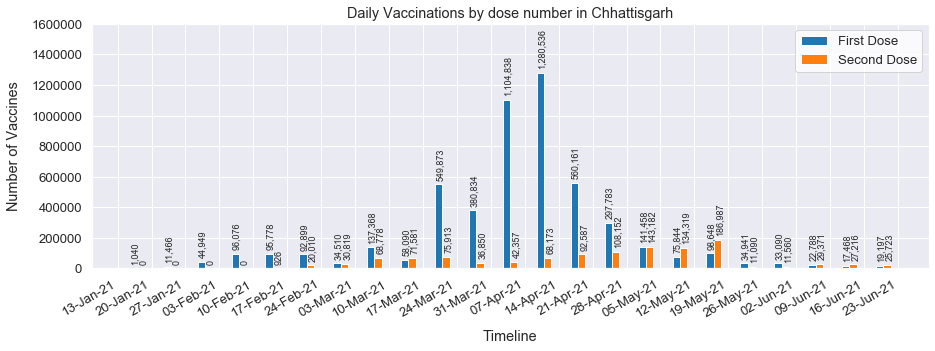

       Dadra and Nagar Haveli and Daman and Diu as of 21-Jun-2021:  First-Dose 290,224;  Second-Dose 27,043;  Total Doses 317,267


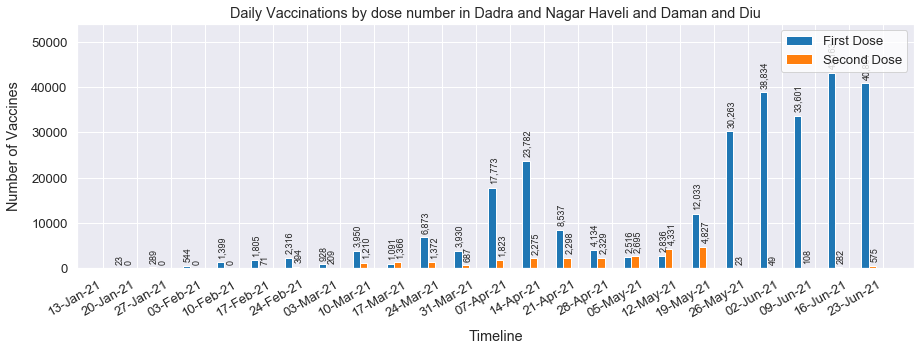

       Delhi as of 21-Jun-2021:  First-Dose 5,013,438;  Second-Dose 1,597,796;  Total Doses 6,611,234


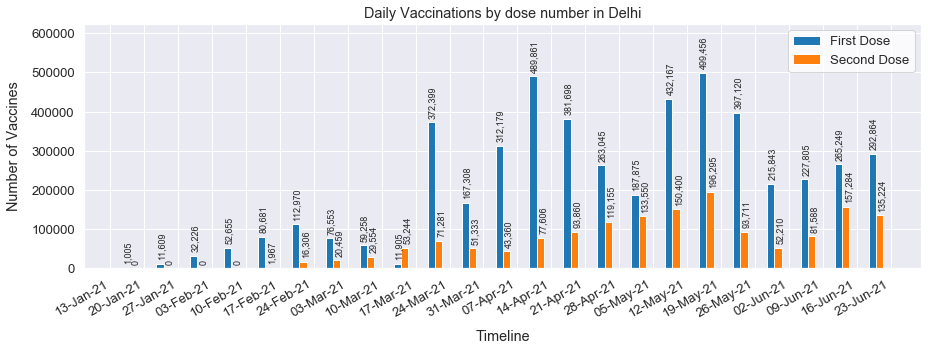

       Goa as of 21-Jun-2021:  First-Dose 674,546;  Second-Dose 101,552;  Total Doses 776,098


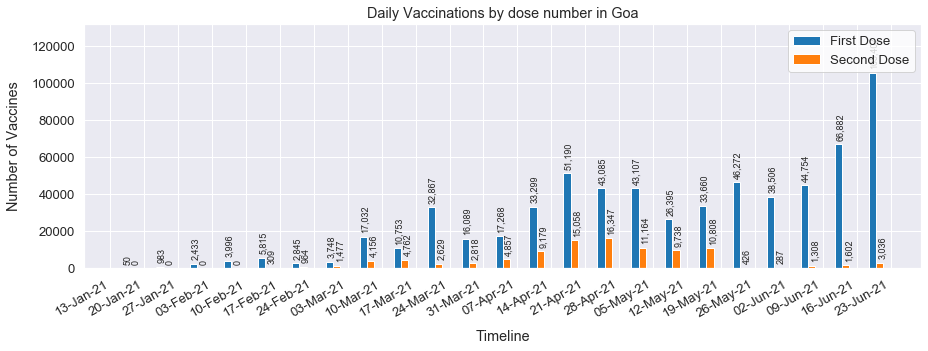

       Gujarat as of 21-Jun-2021:  First-Dose 17,730,463;  Second-Dose 4,889,188;  Total Doses 22,619,651


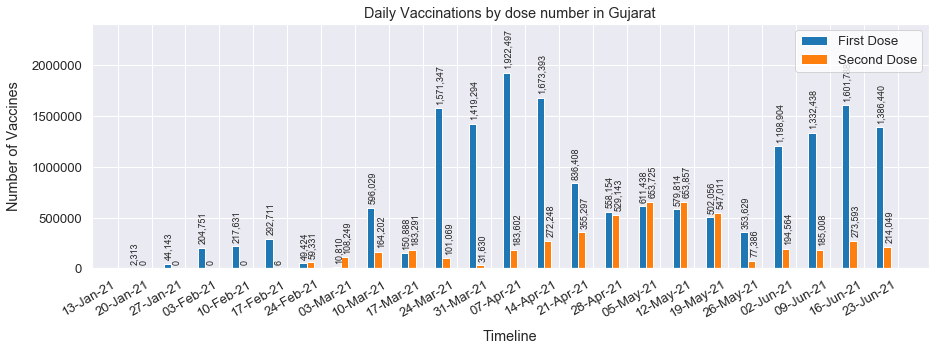

       Haryana as of 21-Jun-2021:  First-Dose 6,690,650;  Second-Dose 1,189,175;  Total Doses 7,879,825


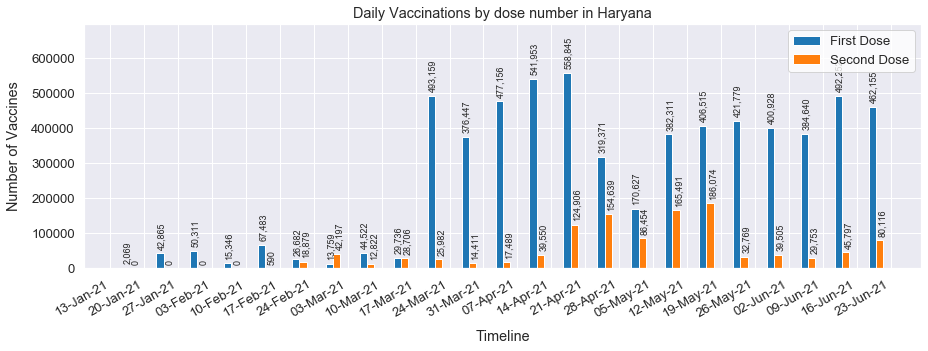

       Himachal Pradesh as of 21-Jun-2021:  First-Dose 2,478,389;  Second-Dose 440,335;  Total Doses 2,918,724


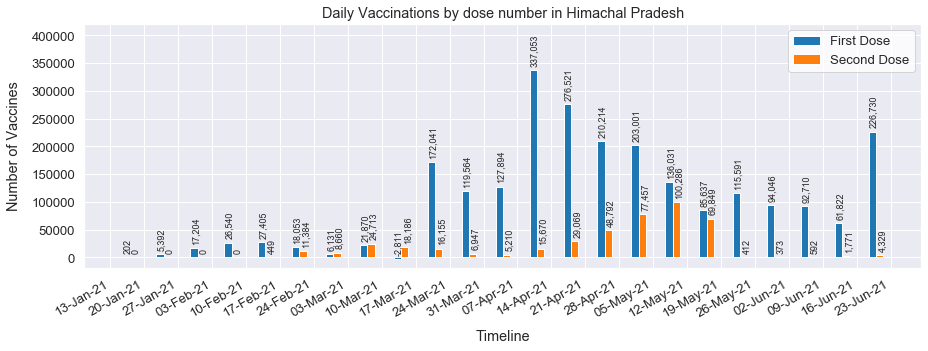

       Jammu and Kashmir as of 21-Jun-2021:  First-Dose 3,402,011;  Second-Dose 607,200;  Total Doses 4,009,211


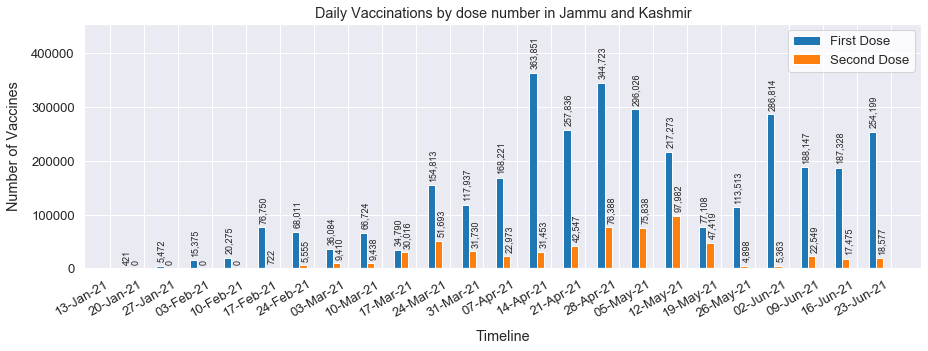

       Jharkhand as of 21-Jun-2021:  First-Dose 4,957,150;  Second-Dose 926,411;  Total Doses 5,883,561


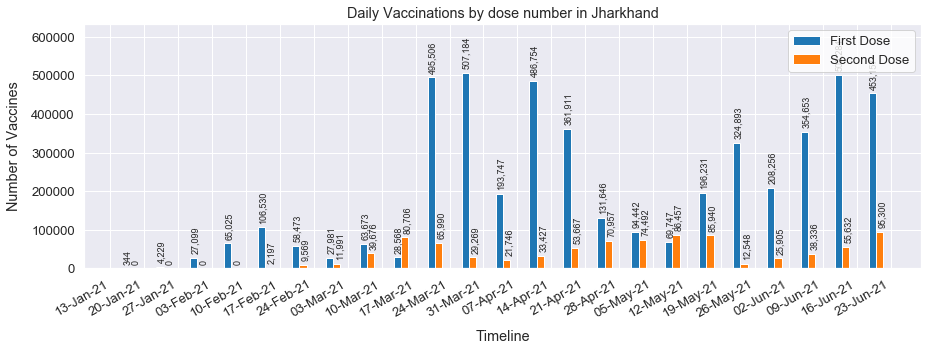

       Karnataka as of 21-Jun-2021:  First-Dose 16,339,169;  Second-Dose 3,313,590;  Total Doses 19,652,759


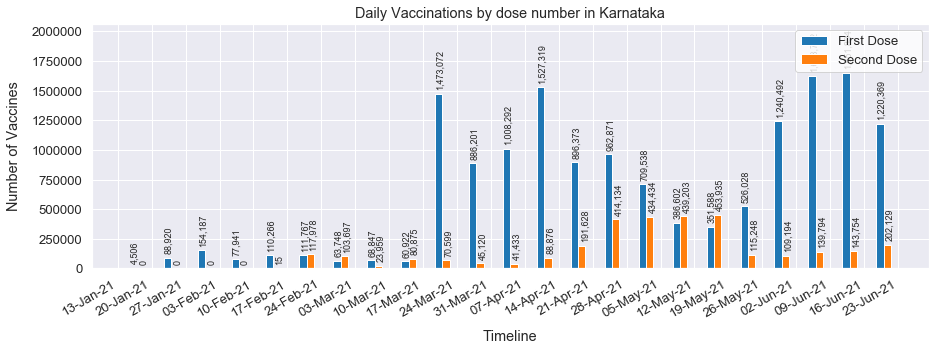

       Kerala as of 21-Jun-2021:  First-Dose 9,878,112;  Second-Dose 2,553,090;  Total Doses 12,431,202


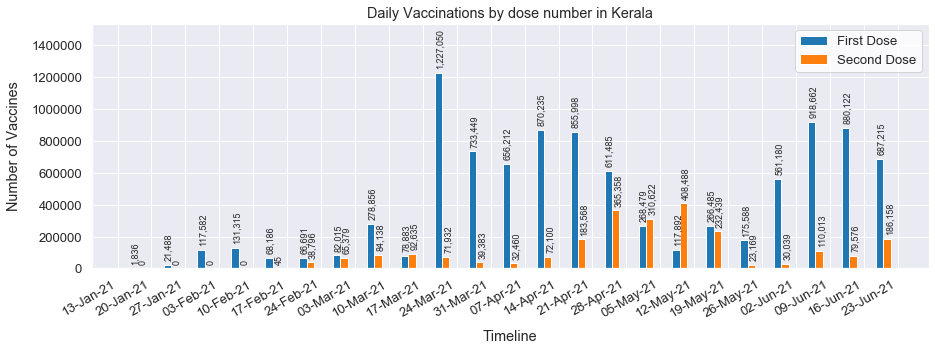

       Ladakh as of 21-Jun-2021:  First-Dose 163,217;  Second-Dose 37,489;  Total Doses 200,706


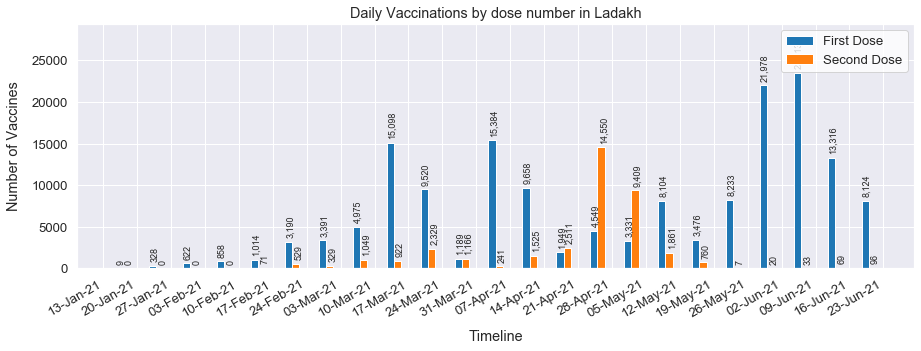

       Lakshadweep as of 21-Jun-2021:  First-Dose 44,826;  Second-Dose 7,175;  Total Doses 52,001


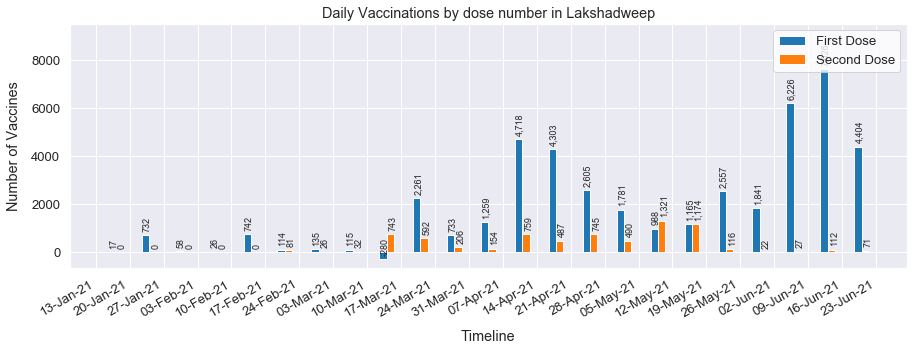

       Madhya Pradesh as of 21-Jun-2021:  First-Dose 14,594,389;  Second-Dose 2,138,809;  Total Doses 16,733,198


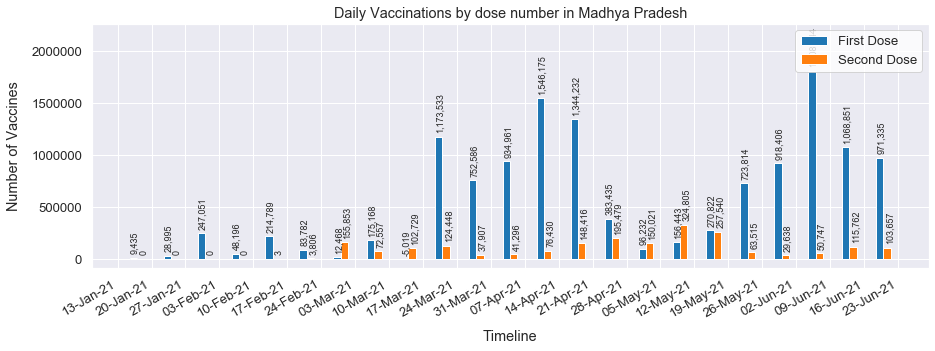

       Maharashtra as of 21-Jun-2021:  First-Dose 22,587,693;  Second-Dose 5,541,075;  Total Doses 28,128,768


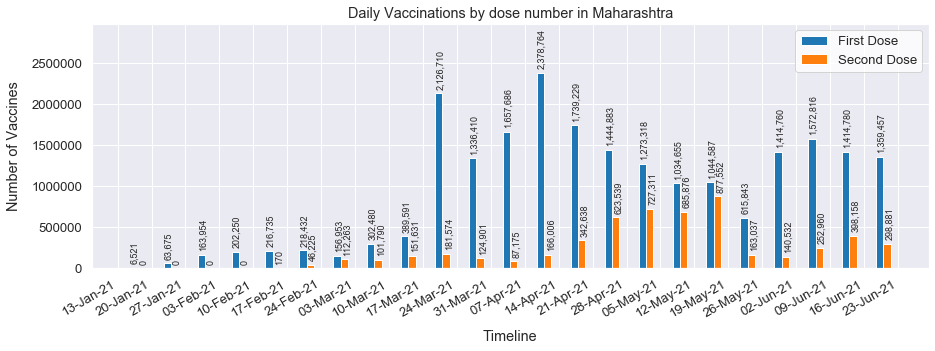

       Manipur as of 21-Jun-2021:  First-Dose 500,102;  Second-Dose 72,295;  Total Doses 572,397


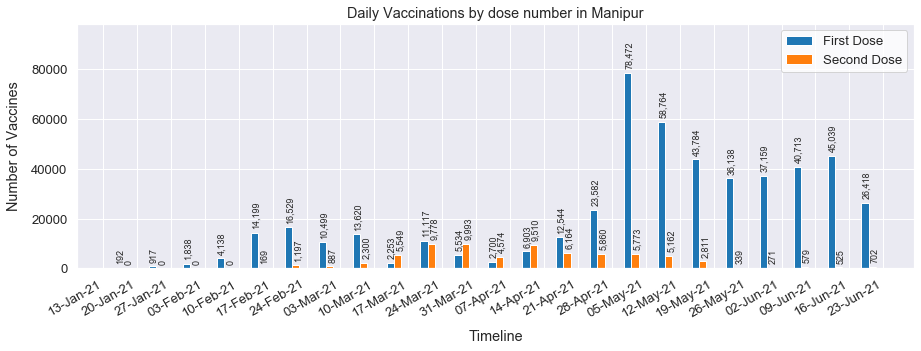

       Meghalaya as of 21-Jun-2021:  First-Dose 528,959;  Second-Dose 75,236;  Total Doses 604,195


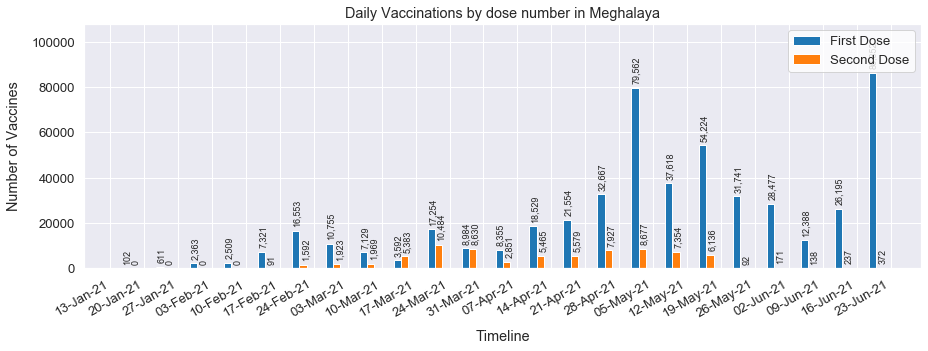

       Mizoram as of 21-Jun-2021:  First-Dose 393,007;  Second-Dose 52,813;  Total Doses 445,820


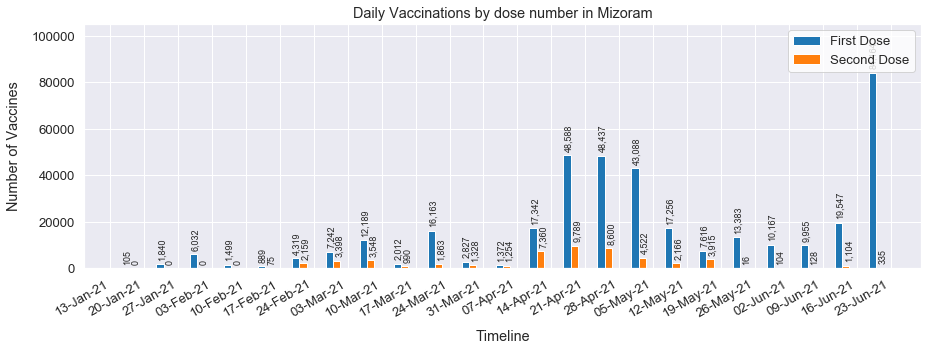

       Nagaland as of 21-Jun-2021:  First-Dose 356,362;  Second-Dose 53,210;  Total Doses 409,572


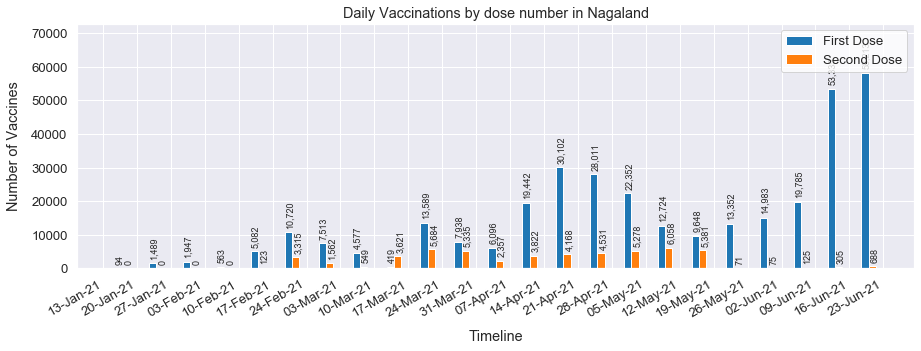

       Odisha as of 21-Jun-2021:  First-Dose 8,309,521;  Second-Dose 1,840,027;  Total Doses 10,149,548


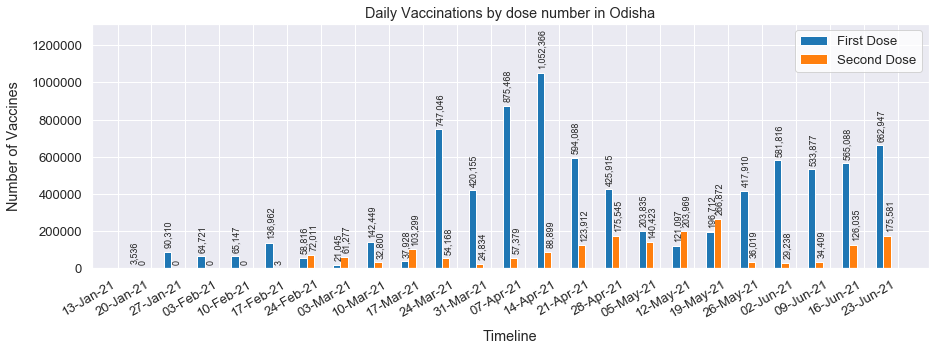

       Puducherry as of 21-Jun-2021:  First-Dose 379,550;  Second-Dose 57,021;  Total Doses 436,571


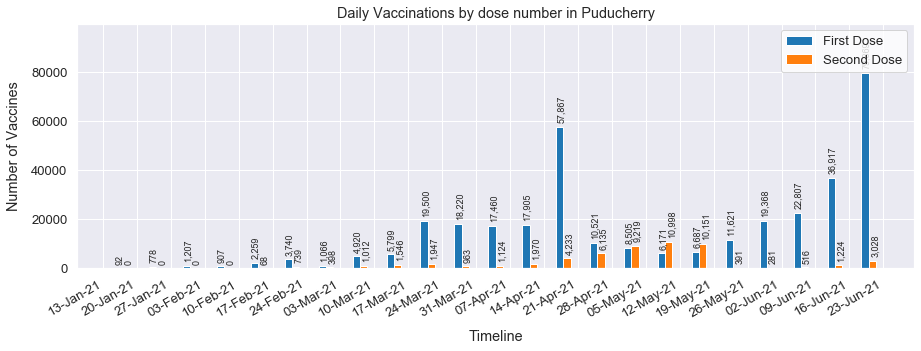

       Punjab as of 21-Jun-2021:  First-Dose 4,654,728;  Second-Dose 867,266;  Total Doses 5,521,994


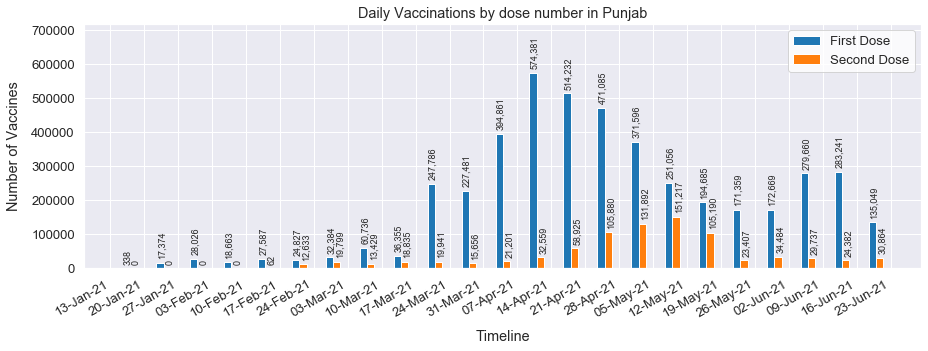

       Rajasthan as of 21-Jun-2021:  First-Dose 18,233,535;  Second-Dose 3,479,509;  Total Doses 21,713,044


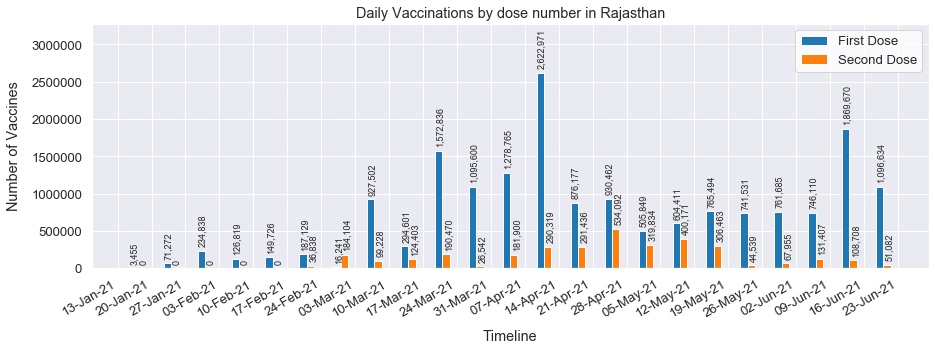

       Sikkim as of 21-Jun-2021:  First-Dose 311,460;  Second-Dose 59,943;  Total Doses 371,403


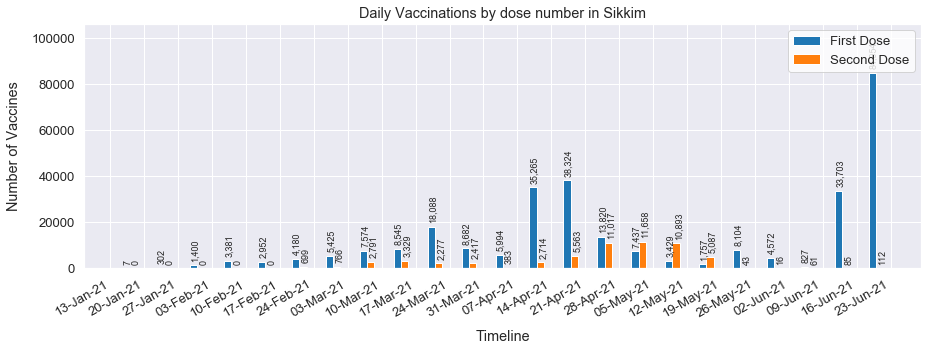

       Tamil Nadu as of 21-Jun-2021:  First-Dose 10,807,056;  Second-Dose 2,299,610;  Total Doses 13,106,666


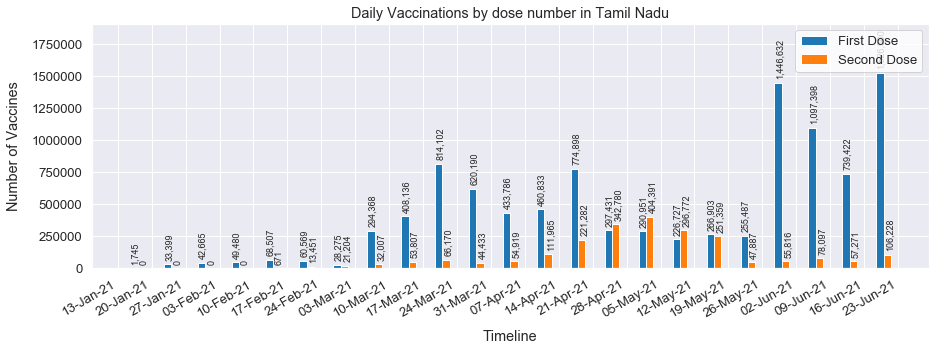

       Telangana as of 21-Jun-2021:  First-Dose 7,928,931;  Second-Dose 1,398,637;  Total Doses 9,327,568


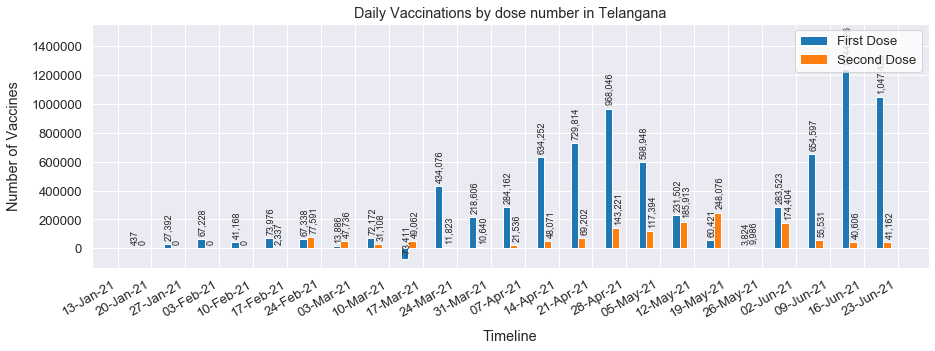

       Tripura as of 21-Jun-2021:  First-Dose 1,549,142;  Second-Dose 544,109;  Total Doses 2,093,251


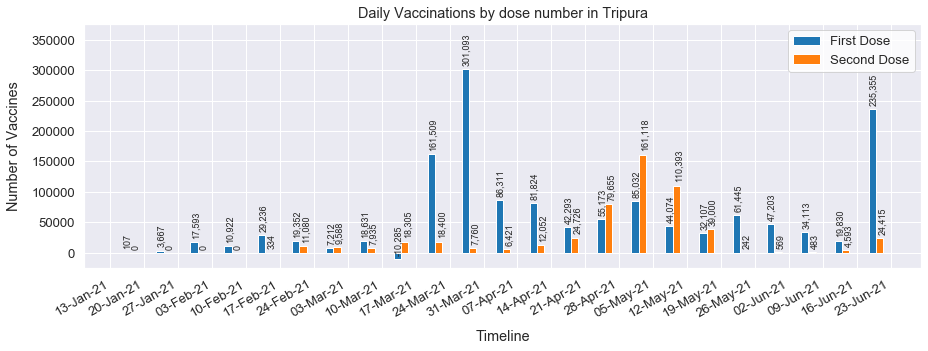

       Uttar Pradesh as of 21-Jun-2021:  First-Dose 22,296,504;  Second-Dose 4,062,906;  Total Doses 26,359,410


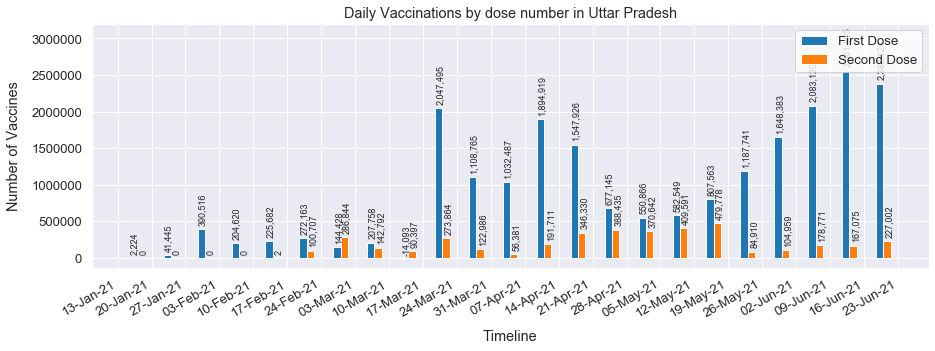

       Uttarakhand as of 21-Jun-2021:  First-Dose 2,938,547;  Second-Dose 737,953;  Total Doses 3,676,500


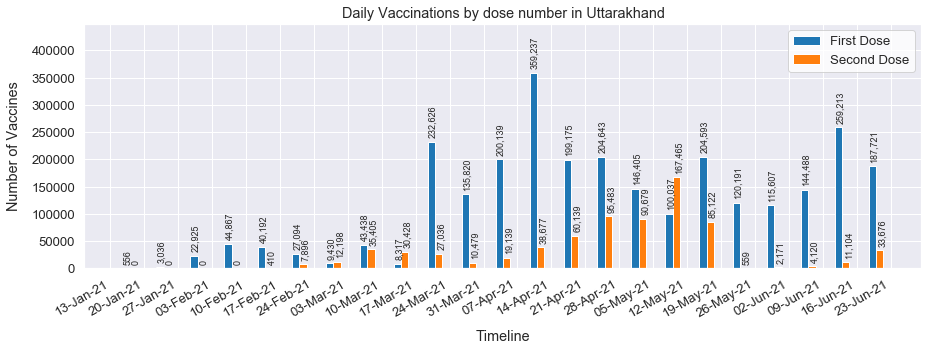

       West Bengal as of 21-Jun-2021:  First-Dose 14,997,560;  Second-Dose 4,352,282;  Total Doses 19,349,842


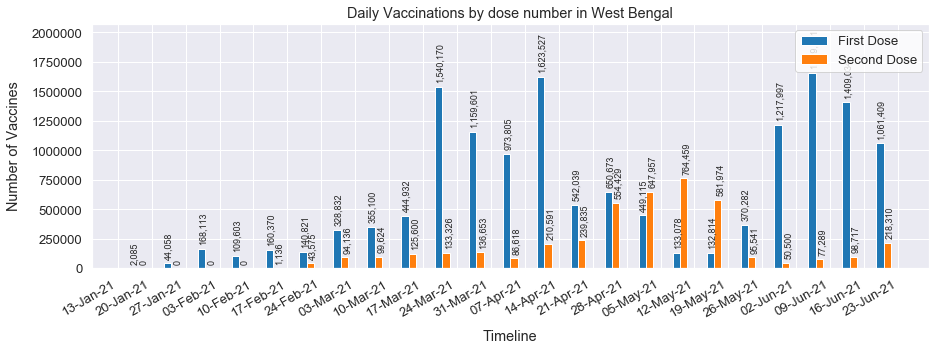

In [72]:
## Plotting daily vaccination jabs by Dose number for every State and UT
for state in states:
    daily_vaccination_plotter_by_dose_number(state)

## c. Daily Vaccinated Individuals by Age Group

In [73]:
## Subset the data only for the time post which age data is available in the dataframe
age_df = mod_df[mod_df['Updated On']>'2021-03-15']
age_df = age_df[['Updated On', 'State','18-45 years (Age)', '45-60 years (Age)', '60+ years (Age)']]
age_df['Total Individuals Vaccinated'] = age_df[['18-45 years (Age)', '45-60 years (Age)', '60+ years (Age)']].sum(axis=1)
age_df.head()

,Updated On,State,18-45 years (Age),45-60 years (Age),60+ years (Age),Total Individuals Vaccinated
59,2021-03-16,Andaman and Nicobar Islands,4663,6173,1111,11947
60,2021-03-17,Andaman and Nicobar Islands,19,107,433,559
61,2021-03-18,Andaman and Nicobar Islands,35,72,332,439
62,2021-03-19,Andaman and Nicobar Islands,31,126,188,345
63,2021-03-20,Andaman and Nicobar Islands,58,182,319,559


In [87]:
## Define a function to plot number of daily vaccinated individuals by age group
def individual_age_plotter(state):
    
    ## Filter for State and find the most latest observation and print the summary numbers of vaccines till date
    df = vac[vac['State']==state]
    last_entry = df[df['Updated On'] == df['Updated On'].max()]
    str_to_print = '       '+state+' as of '+last_entry['Updated On'].iloc[0].strftime("%d-%b-%Y")+': '+\
        ' 18-45 yrs: '+'{:,}'.format(int(last_entry['18-45 years (Age)'].iloc[0]))+'; '+\
        ' 45-60 yrs: '+'{:,}'.format(int(last_entry['45-60 years (Age)'].iloc[0]))+'; '+\
        ' 60+ yrs: '+'{:,}'.format(int(last_entry['60+ years (Age)'].iloc[0]))+'; '+\
        ' Total: '+'{:,}'.format(int(last_entry['18-45 years (Age)'].iloc[0] +\
                                    last_entry['45-60 years (Age)'].iloc[0] +\
                                    last_entry['60+ years (Age)'].iloc[0]))
    print(str_to_print.center(width))
    
    ## Filter for State and summarize daily numbers on weekly level
    state_df = age_df[age_df['State']==state]
    data = state_df.resample('W',on='Updated On').sum()
    data.reset_index(inplace=True)
    
    ## On any given day, calculate how much percentage of vacciated individuals belonged to each category  
    data['18-45 pct'] = round(data['18-45 years (Age)']/data['Total Individuals Vaccinated']*100,2)
    data['45-60 pct'] = round(data['45-60 years (Age)']/data['Total Individuals Vaccinated']*100,2)
    data['60+ pct'] = round(data['60+ years (Age)']/data['Total Individuals Vaccinated']*100,2)

    ## Create a new columns including both absolute numbers and percent to display as text on labels
    data['18-45'] = data['18-45 years (Age)'].apply(lambda x: '{:,}'.format(x)) + ' (' + data['18-45 pct'].apply(str) + '%)'
    data['45-60'] = data['45-60 years (Age)'].apply(lambda x: '{:,}'.format(x)) + ' (' + data['45-60 pct'].apply(str) + '%)'
    data['60+'] = data['60+ years (Age)'].apply(lambda x: '{:,}'.format(x)) + ' (' + data['60+ pct'].apply(str) + '%)'
    
    ## Creating Plots
    fig, ax = plt.subplots(figsize=(15,5))

    ## Plots for Daily Administered Doses of CoviShield and Covaxin over time
    ax.bar(mdates.date2num(data['Updated On'])-1.5,data['18-45 years (Age)'],label='18-45',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+0,data['45-60 years (Age)'],label='45-60',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+1.5,data['60+ years (Age)'],label='60+',width=1.5)
    plt.legend(loc=1,facecolor='White')

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%d-%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1,byweekday=(3)))
    _, y_top = ax.get_ylim()

    ## Using a loop to plot text for all the points of each of the 3 trend lines
    for i in range(len(data)):
            ax.text(mdates.date2num(data['Updated On'].iloc[i])-1.7, y_top/40 + data['18-45 years (Age)'].iloc[i], data['18-45'].iloc[i], rotation=90, size = 9)
            ax.text(mdates.date2num(data['Updated On'].iloc[i])-0.2, y_top/40 + data['45-60 years (Age)'].iloc[i], data['45-60'].iloc[i], rotation=90, size = 9)
            ax.text(mdates.date2num(data['Updated On'].iloc[i])+1.3, y_top/40 + data['60+ years (Age)'].iloc[i],data['60+'].iloc[i],   rotation=90, size = 9)

    ## Adding Labels
    ax.set_ylim(top=data[['18-45 years (Age)','45-60 years (Age)', '60+ years (Age)']].max().max()*1.6)
    fig.autofmt_xdate()
    plt.xlabel('Timeline',labelpad=10)
    plt.ylabel('Number of Individuals Vaccinated',labelpad=10)
    plt.title('Vaccinated Individuals Age wise composition of '+state)
    plt.show()

       India as of 21-Jun-2021:  18-45 yrs: 79,130,988;  45-60 yrs: 88,034,483;  60+ yrs: 66,002,905;  Total: 233,168,376


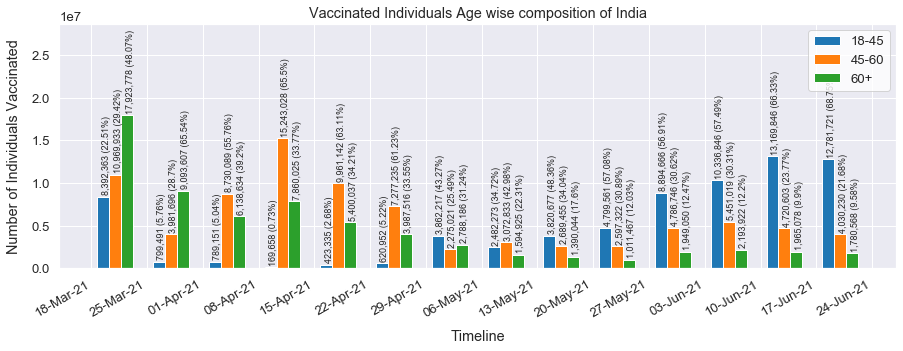

In [88]:
## Plotting number of daily vaccinated individuals by age group for India as a whole
individual_age_plotter('India')

       Andaman and Nicobar Islands as of 21-Jun-2021:  18-45 yrs: 29,585;  45-60 yrs: 61,478;  60+ yrs: 30,897;  Total: 121,960


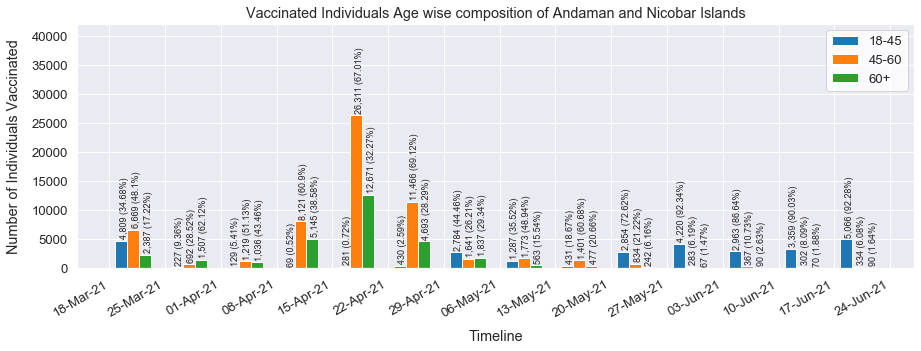

       Andhra Pradesh as of 21-Jun-2021:  18-45 yrs: 2,574,831;  45-60 yrs: 5,523,195;  60+ yrs: 3,165,249;  Total: 11,263,275


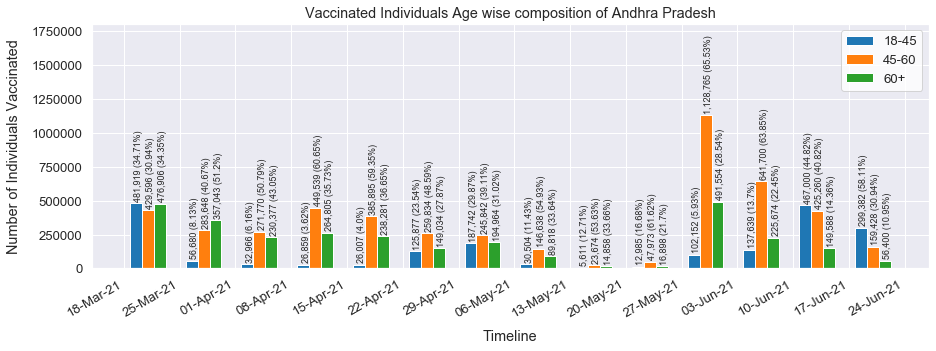

       Arunachal Pradesh as of 21-Jun-2021:  18-45 yrs: 218,032;  45-60 yrs: 141,327;  60+ yrs: 54,829;  Total: 414,188


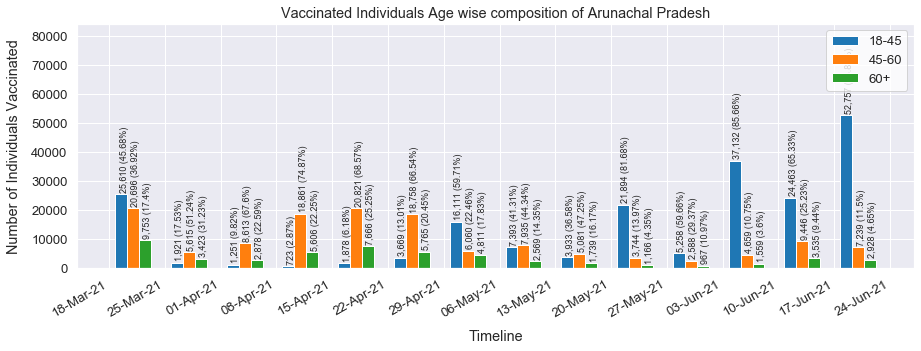

       Assam as of 21-Jun-2021:  18-45 yrs: 1,852,091;  45-60 yrs: 1,864,181;  60+ yrs: 918,457;  Total: 4,634,729


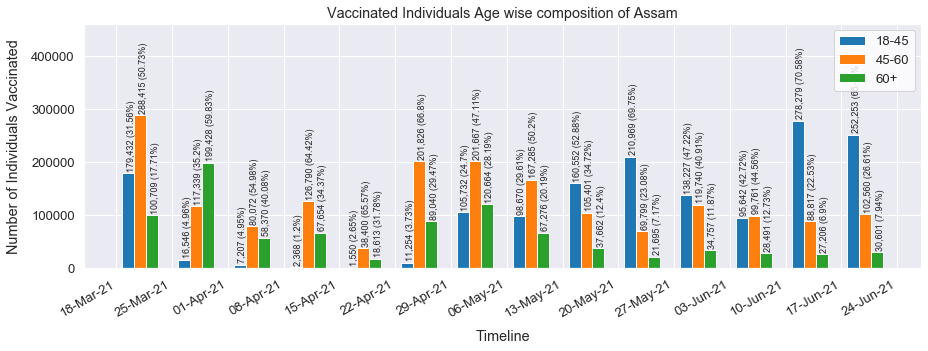

       Bihar as of 21-Jun-2021:  18-45 yrs: 4,888,908;  45-60 yrs: 3,666,729;  60+ yrs: 3,601,112;  Total: 12,156,749


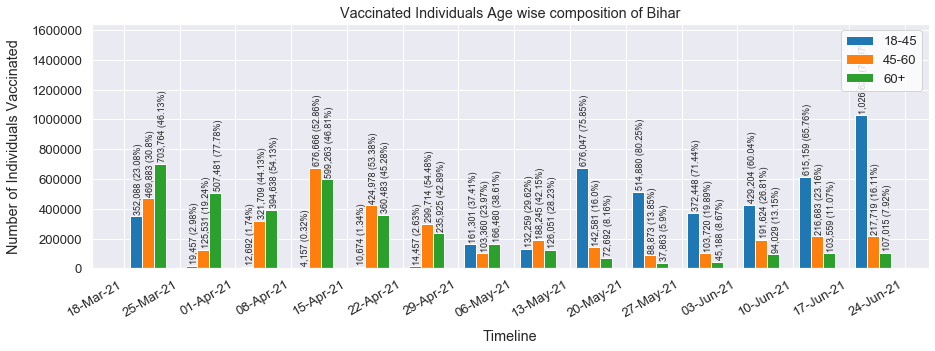

       Chandigarh as of 21-Jun-2021:  18-45 yrs: 174,333;  45-60 yrs: 128,665;  60+ yrs: 79,696;  Total: 382,694


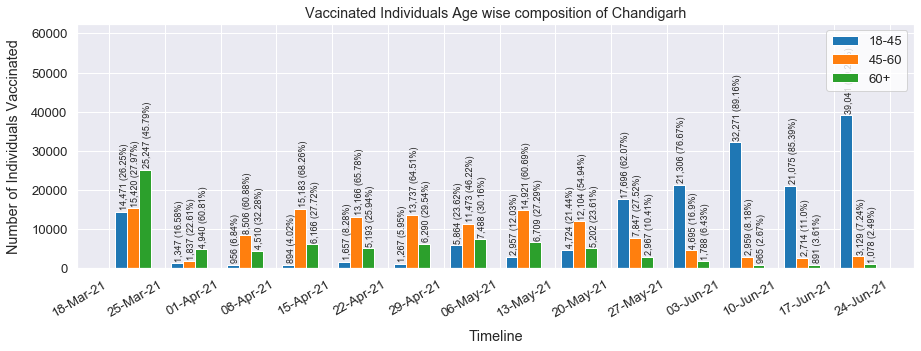

       Chhattisgarh as of 21-Jun-2021:  18-45 yrs: 549,422;  45-60 yrs: 2,966,155;  60+ yrs: 1,762,091;  Total: 5,277,668


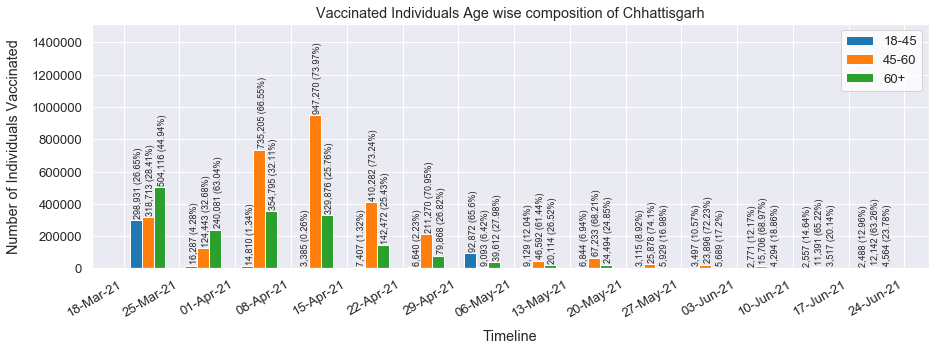

       Dadra and Nagar Haveli and Daman and Diu as of 21-Jun-2021:  18-45 yrs: 206,126;  45-60 yrs: 62,108;  60+ yrs: 21,789;  Total: 290,023


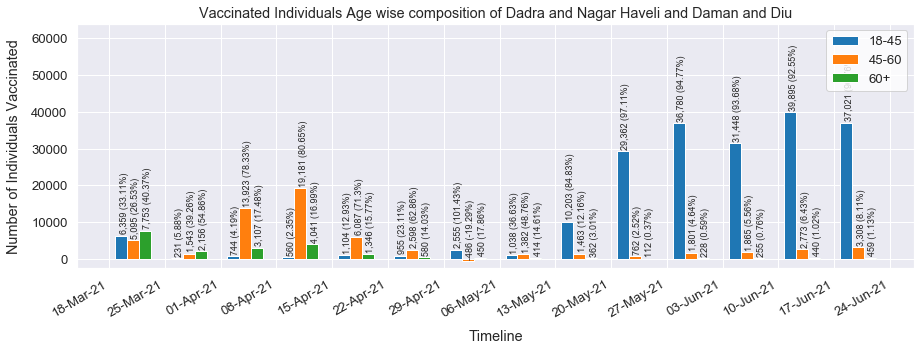

       Delhi as of 21-Jun-2021:  18-45 yrs: 2,145,882;  45-60 yrs: 1,789,183;  60+ yrs: 1,073,669;  Total: 5,008,734


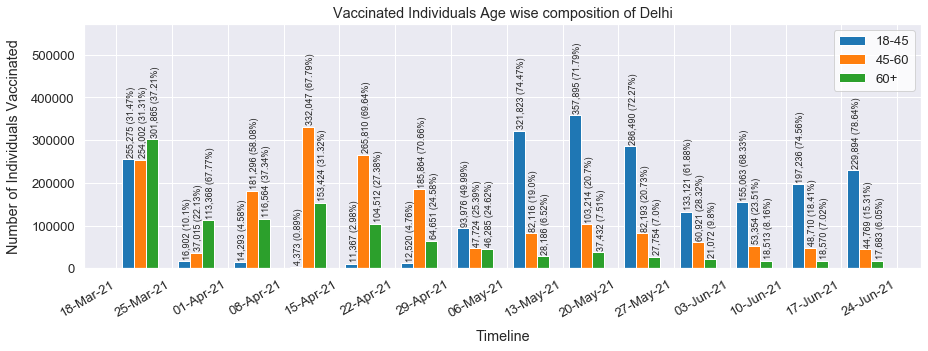

       Goa as of 21-Jun-2021:  18-45 yrs: 308,191;  45-60 yrs: 207,761;  60+ yrs: 158,455;  Total: 674,407


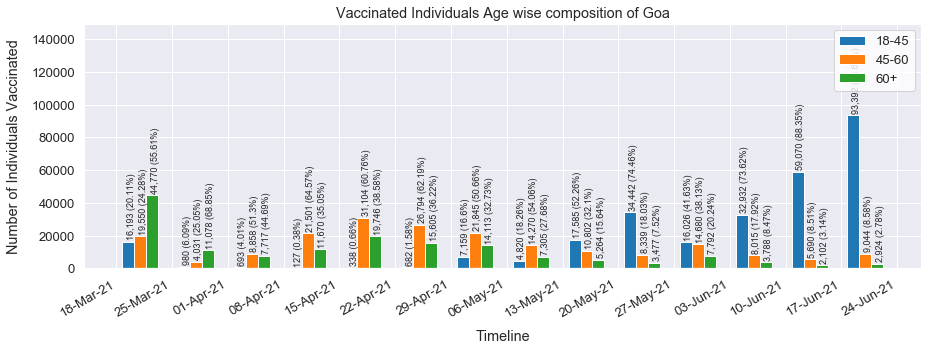

       Gujarat as of 21-Jun-2021:  18-45 yrs: 6,978,741;  45-60 yrs: 6,182,829;  60+ yrs: 4,564,421;  Total: 17,725,991


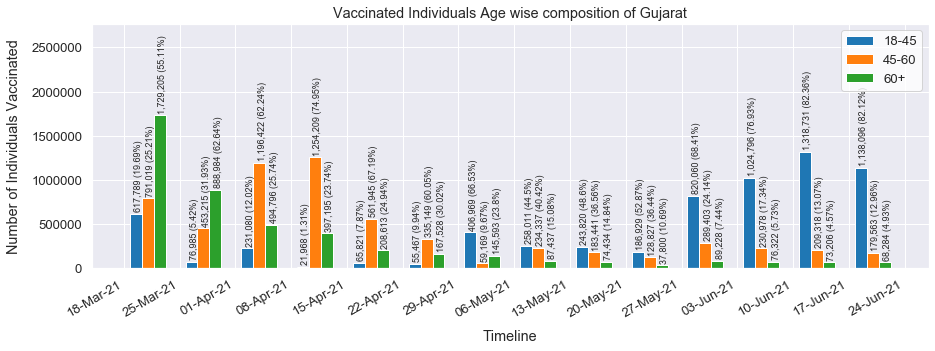

       Haryana as of 21-Jun-2021:  18-45 yrs: 2,849,817;  45-60 yrs: 2,005,635;  60+ yrs: 1,826,874;  Total: 6,682,326


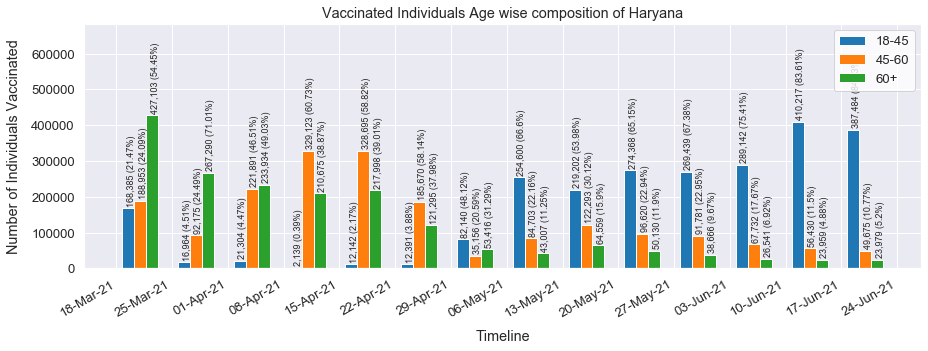

       Himachal Pradesh as of 21-Jun-2021:  18-45 yrs: 634,309;  45-60 yrs: 1,048,548;  60+ yrs: 794,975;  Total: 2,477,832


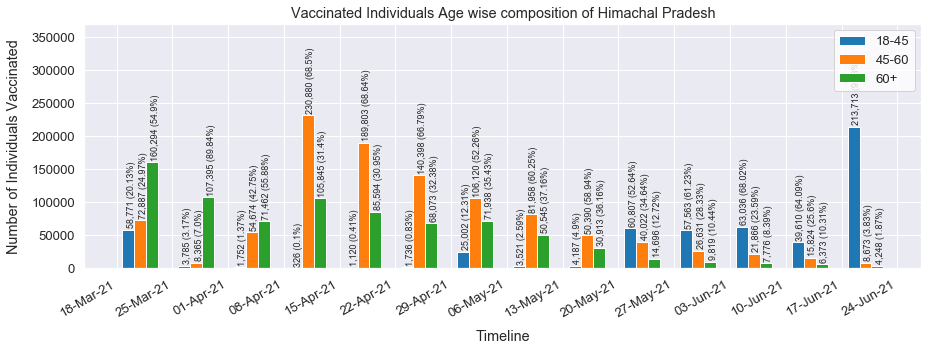

       Jammu and Kashmir as of 21-Jun-2021:  18-45 yrs: 855,010;  45-60 yrs: 1,570,270;  60+ yrs: 976,153;  Total: 3,401,433


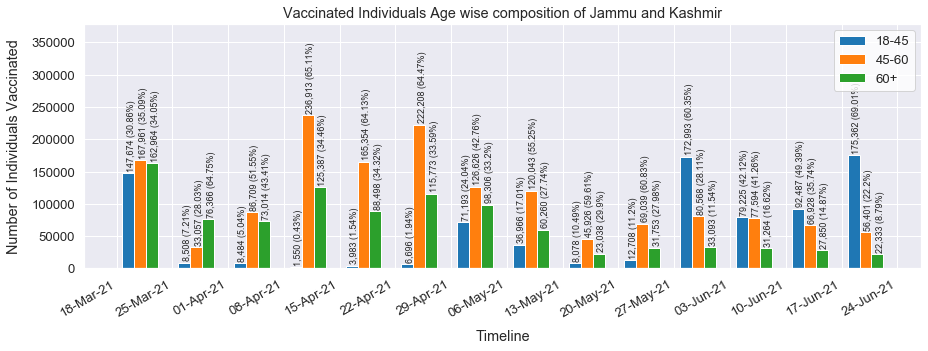

       Jharkhand as of 21-Jun-2021:  18-45 yrs: 1,911,183;  45-60 yrs: 1,699,418;  60+ yrs: 1,344,587;  Total: 4,955,188


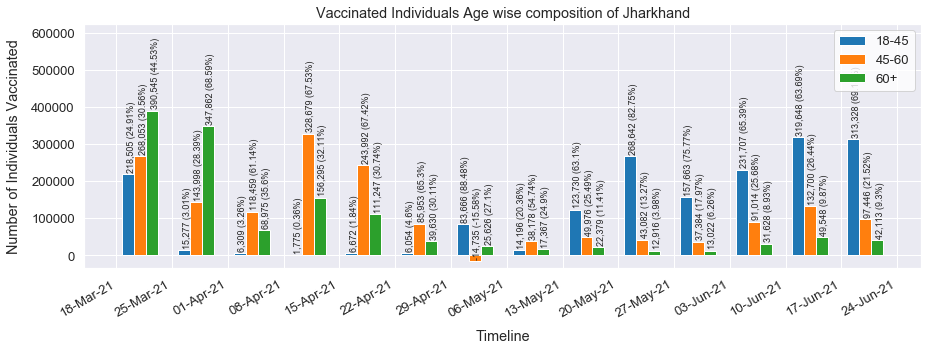

       Karnataka as of 21-Jun-2021:  18-45 yrs: 5,678,809;  45-60 yrs: 6,156,007;  60+ yrs: 4,493,099;  Total: 16,327,915


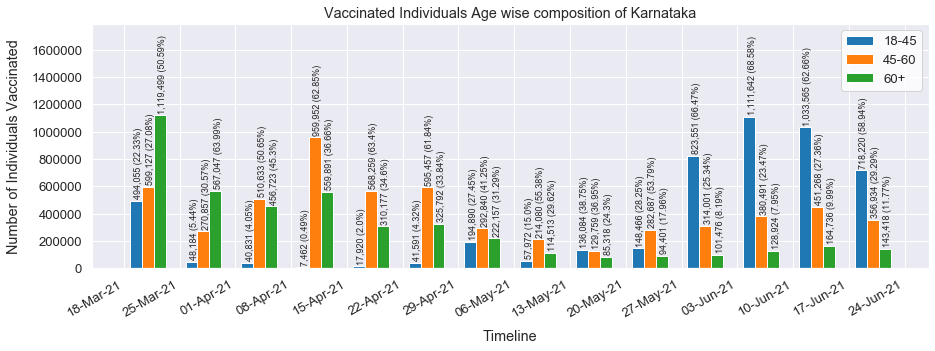

       Kerala as of 21-Jun-2021:  18-45 yrs: 2,194,277;  45-60 yrs: 3,729,702;  60+ yrs: 3,942,402;  Total: 9,866,381


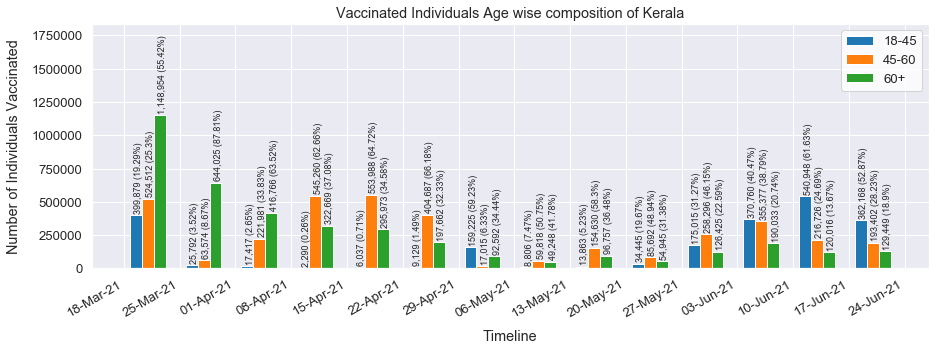

       Ladakh as of 21-Jun-2021:  18-45 yrs: 95,810;  45-60 yrs: 36,941;  60+ yrs: 30,426;  Total: 163,177


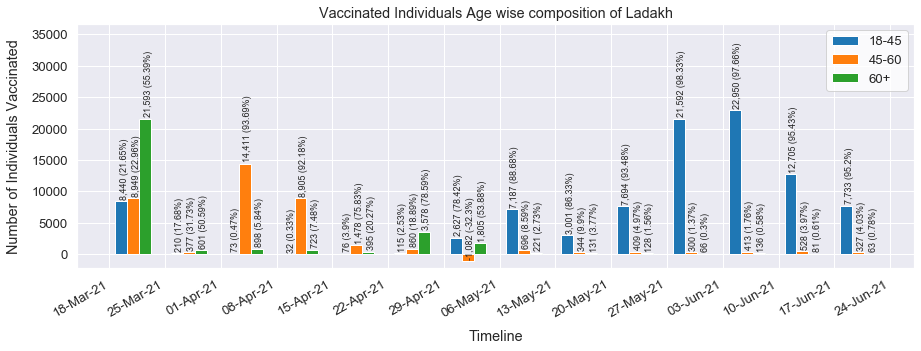

       Lakshadweep as of 21-Jun-2021:  18-45 yrs: 23,765;  45-60 yrs: 13,546;  60+ yrs: 7,515;  Total: 44,826


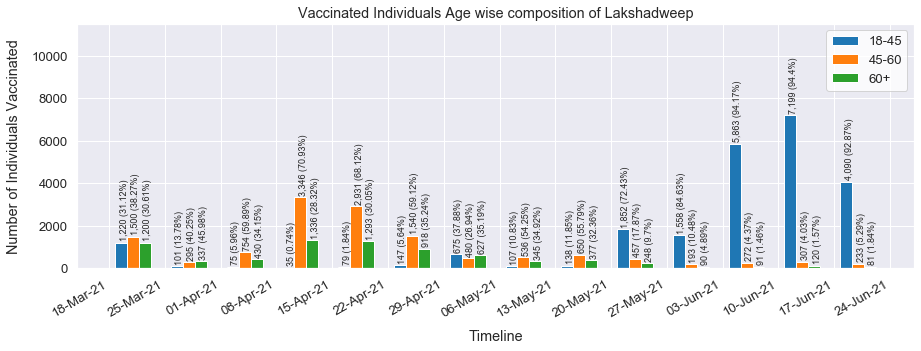

       Madhya Pradesh as of 21-Jun-2021:  18-45 yrs: 6,894,606;  45-60 yrs: 4,399,399;  60+ yrs: 3,294,204;  Total: 14,588,209


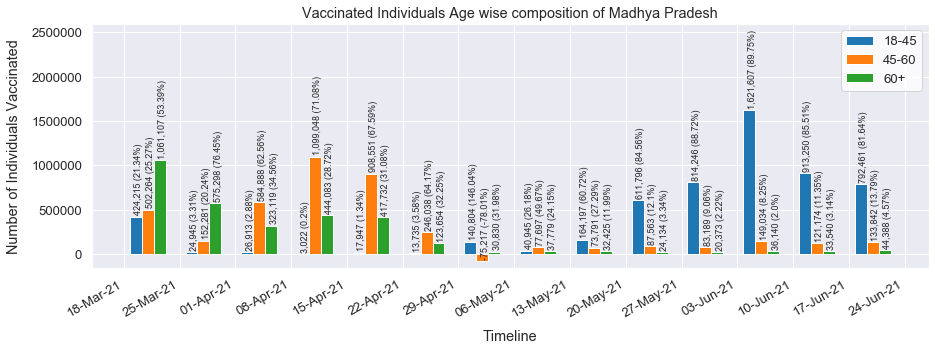

       Maharashtra as of 21-Jun-2021:  18-45 yrs: 5,937,492;  45-60 yrs: 9,241,396;  60+ yrs: 7,391,722;  Total: 22,570,610


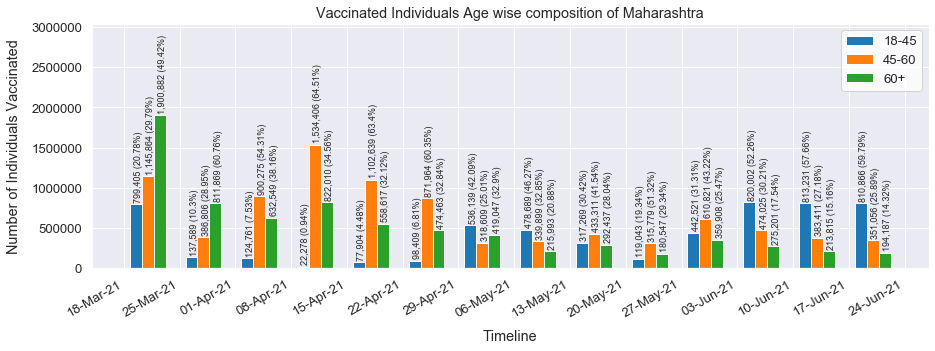

       Manipur as of 21-Jun-2021:  18-45 yrs: 225,954;  45-60 yrs: 176,174;  60+ yrs: 97,724;  Total: 499,852


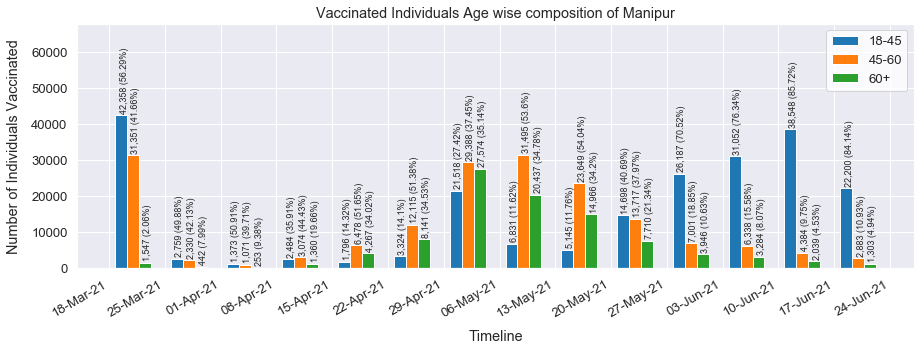

       Meghalaya as of 21-Jun-2021:  18-45 yrs: 265,560;  45-60 yrs: 184,594;  60+ yrs: 78,736;  Total: 528,890


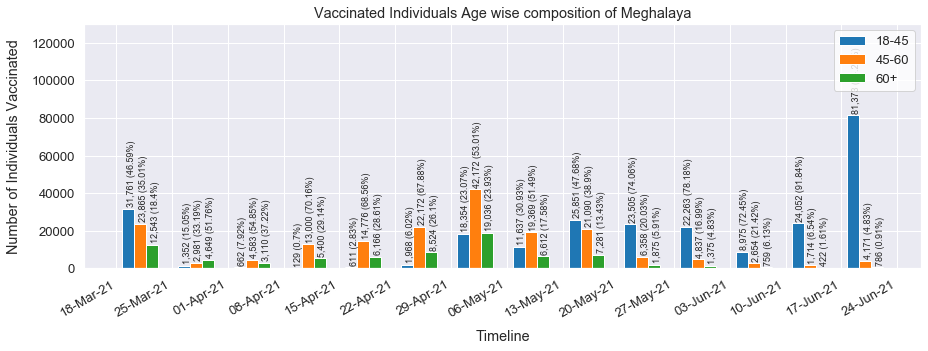

       Mizoram as of 21-Jun-2021:  18-45 yrs: 179,371;  45-60 yrs: 131,064;  60+ yrs: 82,467;  Total: 392,902


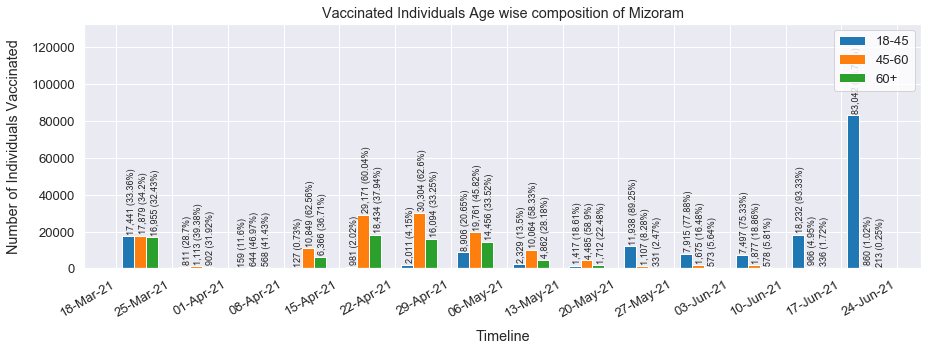

       Nagaland as of 21-Jun-2021:  18-45 yrs: 199,258;  45-60 yrs: 102,169;  60+ yrs: 54,803;  Total: 356,230


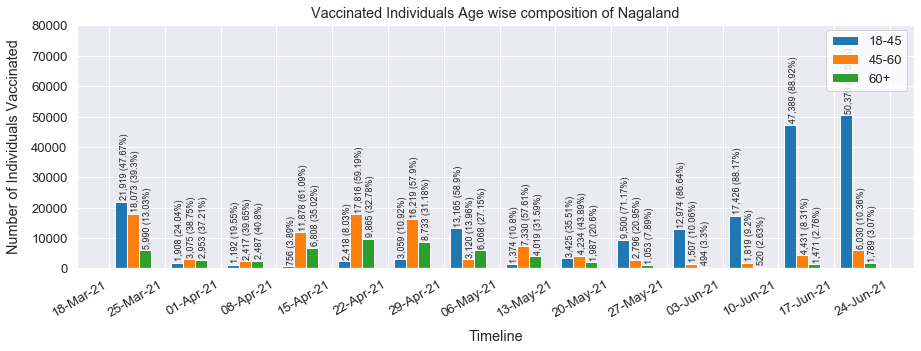

       Odisha as of 21-Jun-2021:  18-45 yrs: 2,159,504;  45-60 yrs: 3,372,413;  60+ yrs: 2,775,542;  Total: 8,307,459


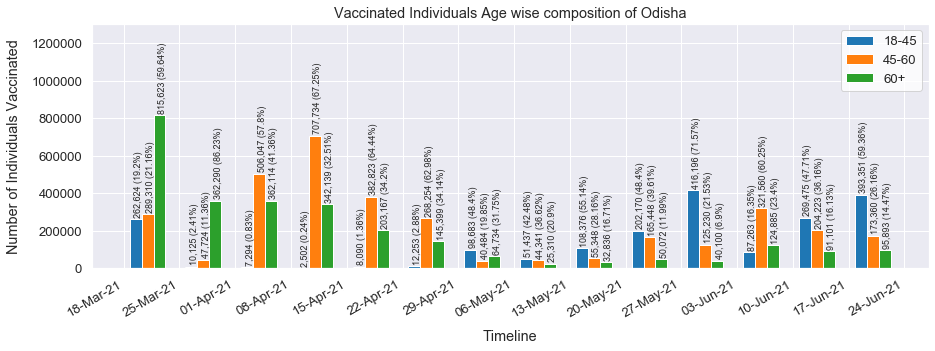

       Puducherry as of 21-Jun-2021:  18-45 yrs: 186,244;  45-60 yrs: 117,027;  60+ yrs: 76,164;  Total: 379,435


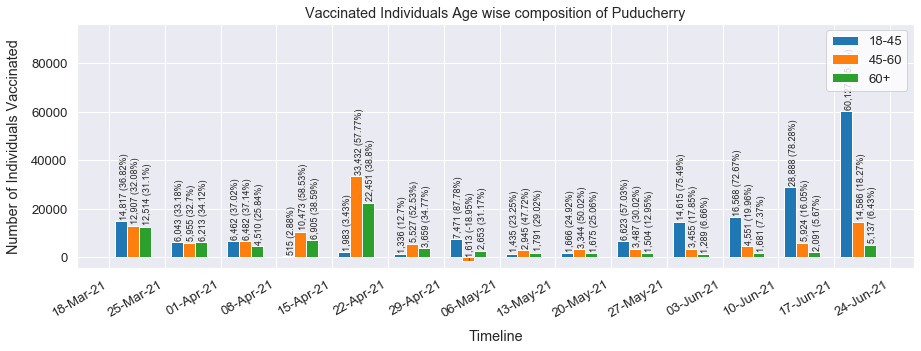

       Punjab as of 21-Jun-2021:  18-45 yrs: 1,288,490;  45-60 yrs: 1,904,566;  60+ yrs: 1,460,959;  Total: 4,654,015


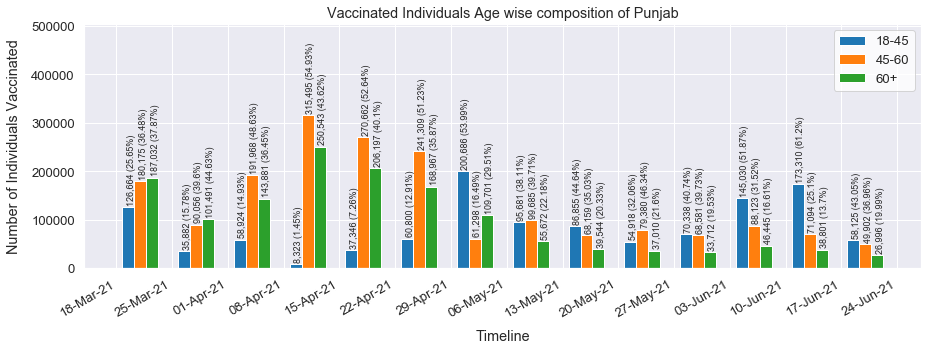

       Rajasthan as of 21-Jun-2021:  18-45 yrs: 6,047,579;  45-60 yrs: 6,381,833;  60+ yrs: 5,793,019;  Total: 18,222,431


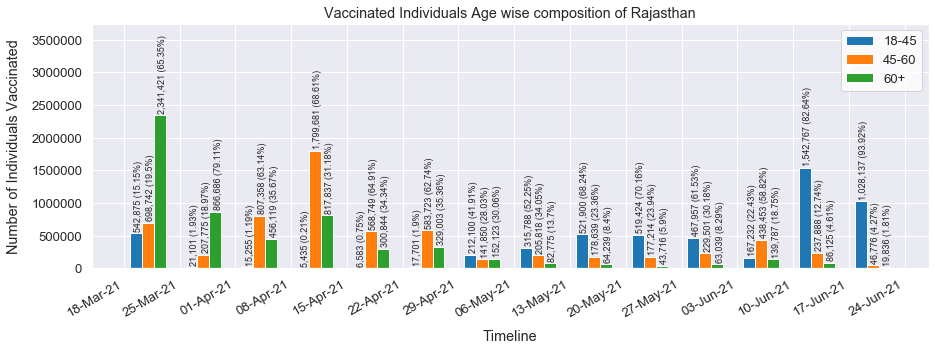

       Sikkim as of 21-Jun-2021:  18-45 yrs: 160,640;  45-60 yrs: 94,458;  60+ yrs: 56,183;  Total: 311,281


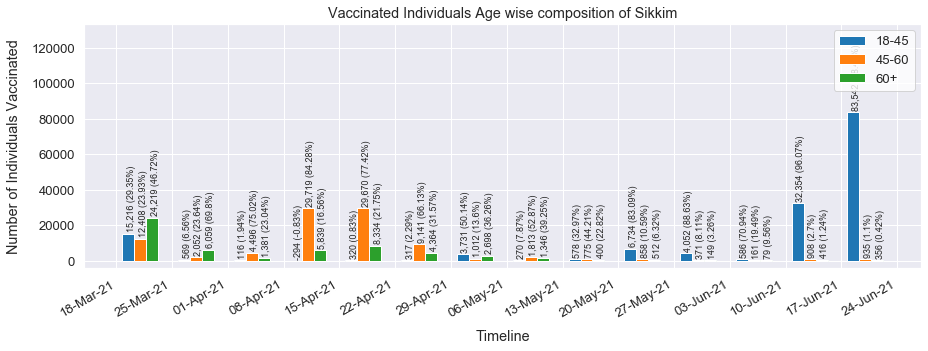

       Tamil Nadu as of 21-Jun-2021:  18-45 yrs: 4,836,041;  45-60 yrs: 3,622,791;  60+ yrs: 2,345,177;  Total: 10,804,009


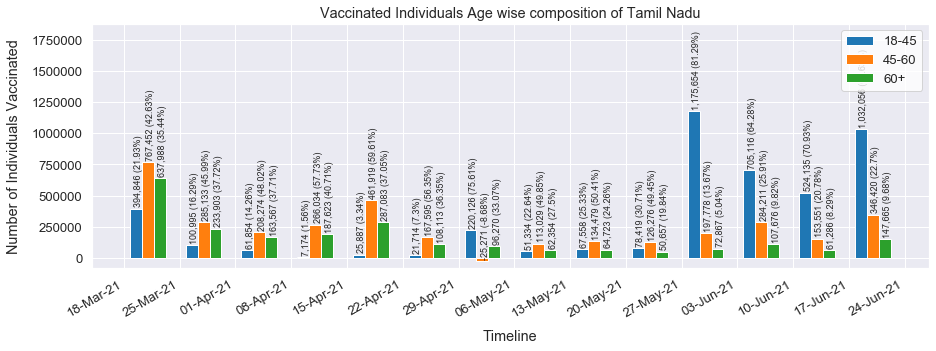

       Telangana as of 21-Jun-2021:  18-45 yrs: 3,197,865;  45-60 yrs: 2,935,151;  60+ yrs: 1,790,941;  Total: 7,923,957


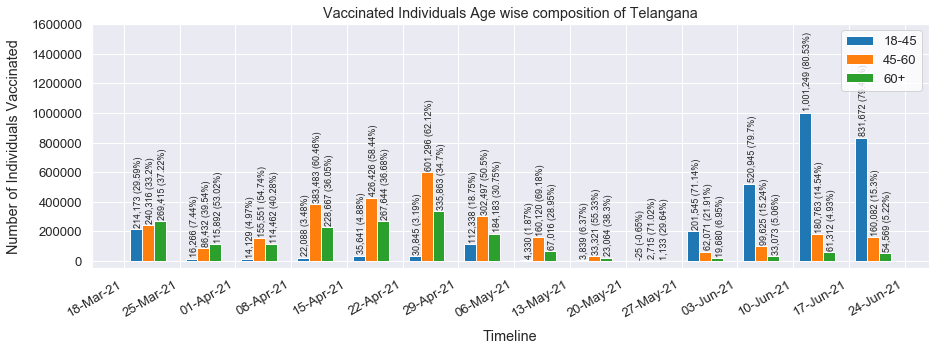

       Tripura as of 21-Jun-2021:  18-45 yrs: 546,374;  45-60 yrs: 658,367;  60+ yrs: 343,559;  Total: 1,548,300


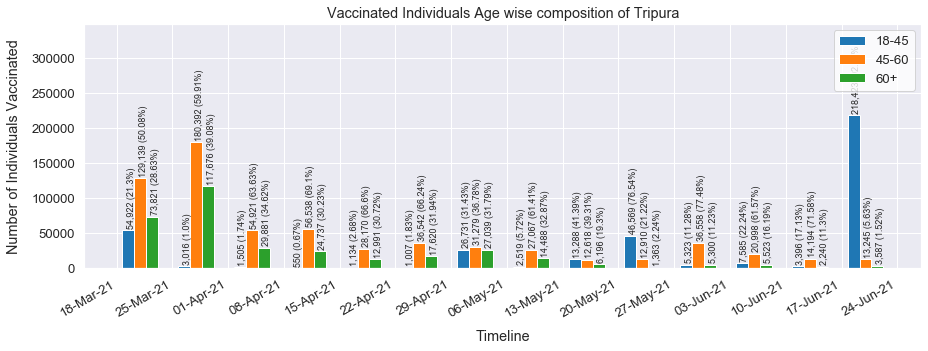

       Uttar Pradesh as of 21-Jun-2021:  18-45 yrs: 7,531,675;  45-60 yrs: 8,753,113;  60+ yrs: 6,001,893;  Total: 22,286,681


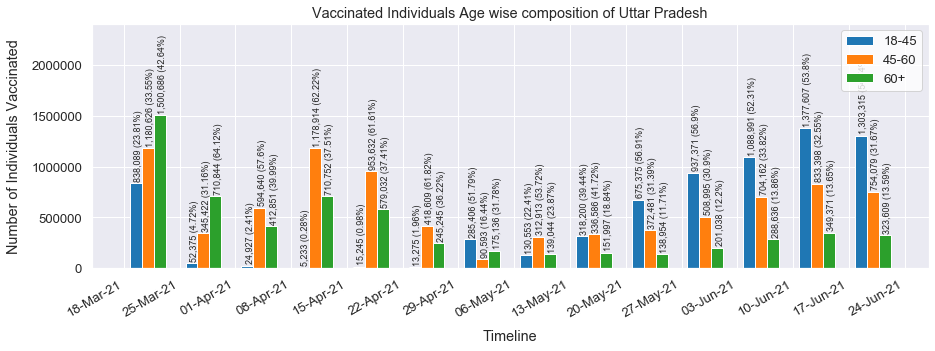

       Uttarakhand as of 21-Jun-2021:  18-45 yrs: 1,004,130;  45-60 yrs: 1,063,021;  60+ yrs: 869,938;  Total: 2,937,089


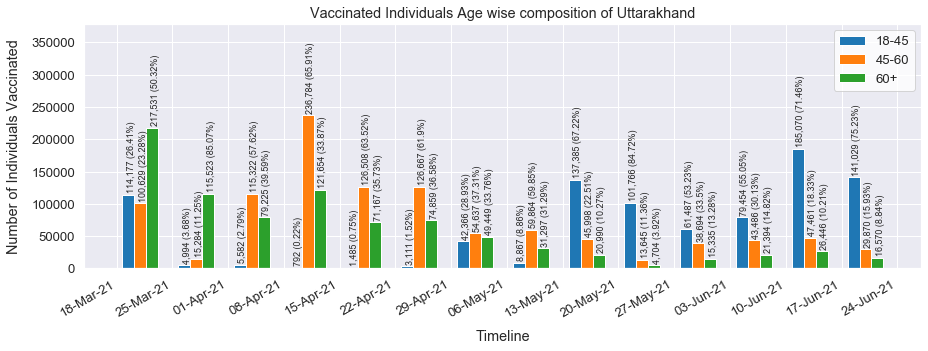

       West Bengal as of 21-Jun-2021:  18-45 yrs: 4,301,083;  45-60 yrs: 6,043,269;  60+ yrs: 4,643,178;  Total: 14,987,530


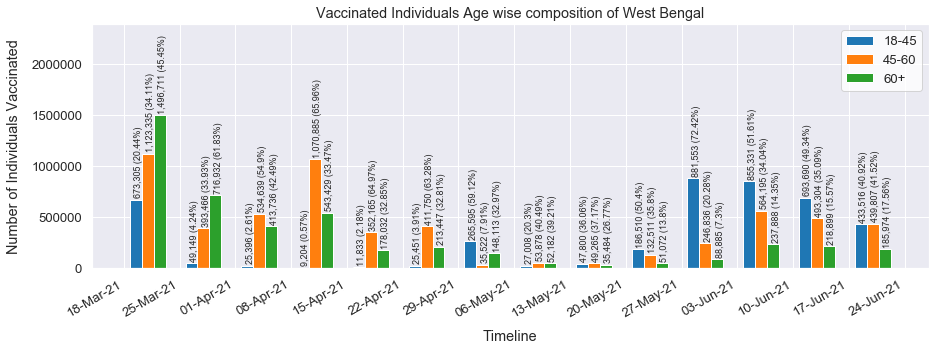

In [76]:
## Plotting number of daily vaccinated individuals by age group for every state and UT
for state in states:
    individual_age_plotter(state)